# <font color= 'blue'> Deep Learning

# <font color='blue'> Homework 3 </font>

## <font color= 'blue'> Creating a custom object detection model with YOLO
Mehek Niwas || MTH 4320 Fall 2023

# <font color='blue'> Dataset Preparation & Preprocessing </font>
*Collect or create a dataset of images containing the objects you want to detect annotated with bounding boxes. Implement data preprocessing techniques, including resizing images and normalizing pixels.*

I used the "plantdoc" dataset (version 4) posted by Joseph Nelson. It was pre-annotated on roboflow and already in a format compatible with yolov8. No preprocessing was neccessary. The dataset has 2,009 images in the training set (78%), 314 images in the validation set (12%), and 246 images in the test set (10%).

The data itself was collected by researchers from IIT. Their paper was titled *PlantDoc: A Dataset for Visual Plant Disease Detection*.

Link: https://universe.roboflow.com/joseph-nelson/plantdoc/dataset/4

Update: I had to add and move some folders in order for the code to be able to find the dataset (based off of ultralytics documentation: https://github.com/ultralytics/yolov5/wiki/Train-Custom-Data)

- added folder "datasets" under "content"
- added folder "PlantDoc-4" under "datasets"
because path needs to be <font color='blue'> `content/datasets/PlantDoc-4/data.yaml` </font>
- moved previously downloaded "PlantDoc-4" zip file (with test, train, valid folders) under "PlantDoc-4"
because path needs to be <font color='blue'> `content/datasets/PlantDoc-4/PlantDoc-4/train/images` </font>

Final folder organization within Google Colab directory:

    content
      datasets
        PlantDoc-4
          README.dataset.txt
          README.dataset.text
          data.yaml
          PlantDoc-4
            test
            train
            valid

In [ ]:
from IPython import display
!pip install matplotlib
display.clear_output()

In [ ]:
!nvidia-smi # making sure GPU is running

Wed Jan 10 18:08:29 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   59C    P8              10W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
# another check to make sure GPU is working

import tensorflow as tf
from tensorflow.python.client import device_lib

numGPUs = len(tf.config.experimental.list_physical_devices('GPU'))
print('Num GPUs Available: ', numGPUs)
if numGPUs > 0:
  print(tf.test.gpu_device_name())
  print(device_lib.list_local_devices()[1].physical_device_desc)

# check if cuda is available
import torch
if torch.cuda.is_available():
  print("CUDA is available!")
else:
  print("CUDA is not available. Using CPU.")

In [ ]:
!pip install roboflow
!pip install ultralytics

from roboflow import Roboflow
import ultralytics
display.clear_output()

ultralytics.checks()

rf = Roboflow(api_key="uD5buac7JcoSpUrviFBd")
project = rf.workspace("joseph-nelson").project("plantdoc")
dataset = project.version(4).download("yolov8") # changed from version 1 to version 4

# add/move folders that were mentioned previously after dataset zip file has been downloaded!!

Ultralytics YOLOv8.1.14 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 26.5/78.2 GB disk)
loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics==8.0.196 is required but found version=8.1.14, to fix: `pip install ultralytics==8.0.196`



Extracting Dataset Version Zip to PlantDoc-4 in yolov8:: 100%|██████████| 5150/5150 [00:01<00:00, 2878.59it/s]


# <font color='blue'> Model Architecture </font>
*Train a YOLOv8 model on your selected dataset using the public repository with ultralytics by Roboflow. Monitor training progress and use appropriate techniques to prevent overfitting. Do at least 3 tuning experiments*

First, I ran a model with no modifications. Then, I did a tuning experiment with more iterations of YOLO. The model did not seem to have much overfitting, so I decided to decrease the number of epochs for enhanced training. In the final tuning experiment, I increased the number of batches per epoch (while saving the best weights for the model). I also decreased the number of iterations in the same experiment.

In [ ]:
from roboflow import Roboflow
import ultralytics
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, LeakyReLU, Bidirectional, LSTM, SimpleRNN

In [ ]:
dataset_config_path = '/content/datasets/PlantDoc-4/data.yaml'

# <font color='blue'> Tuning Experiment 1: Unmodified YOLO model
*Description/Issues*:
I had some trouble with running the model using the specific data set I was using, but then I realized that I needed to add and move some folders according to ultralytics documentation. I added these steps to the dataset preparation and preprocessing section for future reference.

## <font color='purple'>  Unmodified YOLO model: </font>
- Adam W optimizer, epochs = 10

- has auto starter for lr and momentum --> YOLO model initalized as only Adam W optimizer may be a better comparison point as "unmodified" since it does not have an auto starter for lr and momentum

```
Epoch 10/10 results:
 box=1.16, cls loss=2.368, mAP50=0.422, P=0.352, R=0.521
```
## box=1.16, cls loss=2.368, mAP50=0.422, P=0.352, R=0.521

In [ ]:
class Model: # DO NOT RUN AGAIN

  def __init__(self):

    # creating an instance of the YOLO model using the weights file yolov8n.pt
    # independent of dataset
    self.model = ultralytics.YOLO('yolov8n.pt')

    self.results = self.model.train(data=dataset_config_path, epochs=10)
    # the .yaml file contains information about the dataset like the paths to the train/test/valid data files
    # epochs --> complete pass through training dataset

    self.metrics = self.model.val() # storing evaluation meterics from validation on training model


def main():
  m = Model()
  m.model

main()


SyntaxError: positional argument follows keyword argument (<ipython-input-1-9bfc36d534c2>, line 9)

# <font color='blue'>Tuning Experiment 2: Comparing Optimizers

*Description/Issues*: The models were taking a very long time to run. One of the problems was that the notebook was using CPU instead of GPU without me noticing, so I added a command in the beginning of the notebook to make sure GPU was being utilized.

I also found that sometimes the tuner function was taking too long, so I switched to only using the trainer function of ultralytics for faster results and experiments.

- compared Adam optimizer to AdamW optimizer
- kept epochs constant (10)

*Results*: AdamW and Adam results were very similar. I continued with both in tuning experiment 3 to see if the similarity in results would change eventually.

## <font color='purple'>  AdamW YOLO model: </font>
- I think this model makes more sense to determine as truly "unmodified" as a point of comparison, since there is no specific auto starter to determine the beginning learning rate and momentum
- Adam W optimizer, epochs = 10

```
Epoch 10/10 results:
 box=1.441, cls loss=2.877, mAP50=0.158, P=0.504, R=0.21
```
##  box=1.441, cls loss=2.877, mAP50=0.158, P=0.504, R=0.21


In [ ]:
class Model: # DO NOT RUN AGAIN
  def __init__(self):
    self.model = ultralytics.YOLO('yolov8n.pt')
    self.results = self.model.train(data=dataset_config_path, epochs=10, optimizer='AdamW', plots=True, save=False, val=True)
    self.metrics = self.model.val()

def main():
  m = Model()
  m.model

main()


Ultralytics YOLOv8.0.238 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/datasets/PlantDoc-4/data.yaml, epochs=10, time=None, patience=50, batch=16, imgsz=640, save=False, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=AdamW, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_co

100%|██████████| 755k/755k [00:00<00:00, 84.2MB/s]

Overriding model.yaml nc=80 with nc=30

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytic

Model summary: 225 layers, 3016698 parameters, 3016682 gradients, 8.2 GFLOPs

Transferred 319/355 items from pretrained weights
TensorBoard: Start with 'tensorboard --logdir runs/detect/train', view at http://localhost:6006/
Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks with YOLOv8n...
WARNING ⚠️ NMS time limit 0.550s exceeded
AMP: checks passed ✅


train: Scanning /content/datasets/PlantDoc-4/PlantDoc-4/train/labels... 2009 images, 9 backgrounds, 0 corrupt: 100%|██████████| 2009/2009 [00:01<00:00, 1966.05it/s]

train: New cache created: /content/datasets/PlantDoc-4/PlantDoc-4/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/datasets/PlantDoc-4/PlantDoc-4/valid/labels... 314 images, 1 backgrounds, 0 corrupt: 100%|██████████| 314/314 [00:00<00:00, 831.97it/s]

val: New cache created: /content/datasets/PlantDoc-4/PlantDoc-4/valid/labels.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: AdamW(lr=0.01, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      2.68G      1.705      4.054      1.801         26        640: 100%|██████████| 126/126 [01:26<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/10 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.100s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  10%|█         | 1/10 [00:04<00:40,  4.54s/it]

WARNING ⚠️ NMS time limit 2.100s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  20%|██        | 2/10 [00:07<00:27,  3.46s/it]

WARNING ⚠️ NMS time limit 2.100s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  30%|███       | 3/10 [00:09<00:21,  3.08s/it]

WARNING ⚠️ NMS time limit 2.100s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  40%|████      | 4/10 [00:12<00:17,  2.84s/it]

WARNING ⚠️ NMS time limit 2.100s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 5/10 [00:15<00:14,  2.80s/it]

WARNING ⚠️ NMS time limit 2.100s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  60%|██████    | 6/10 [00:17<00:10,  2.72s/it]

WARNING ⚠️ NMS time limit 2.100s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  70%|███████   | 7/10 [00:20<00:07,  2.65s/it]

WARNING ⚠️ NMS time limit 2.100s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  80%|████████  | 8/10 [00:22<00:05,  2.56s/it]

WARNING ⚠️ NMS time limit 2.100s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  90%|█████████ | 9/10 [00:25<00:02,  2.57s/it]

WARNING ⚠️ NMS time limit 1.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:27<00:00,  2.79s/it]

                   all        314       1191     0.0744      0.139     0.0421     0.0145



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      2.41G      1.842      3.729      1.931         73        640: 100%|██████████| 126/126 [01:11<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.43it/s]


                   all        314       1191      0.462      0.101     0.0241     0.0102

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      2.44G       1.81      3.661      1.895         28        640: 100%|██████████| 126/126 [01:13<00:00,  1.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.42it/s]


                   all        314       1191      0.457      0.119     0.0277     0.0155

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      2.43G      1.732      3.502      1.831         20        640: 100%|██████████| 126/126 [01:13<00:00,  1.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.73it/s]

                   all        314       1191      0.191      0.184     0.0594     0.0366



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      2.43G      1.662      3.387      1.756         28        640: 100%|██████████| 126/126 [01:11<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.05it/s]


                   all        314       1191      0.474      0.134     0.0881      0.055

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10       2.4G        1.6      3.246      1.706         33        640: 100%|██████████| 126/126 [01:14<00:00,  1.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.55it/s]


                   all        314       1191      0.507      0.145     0.0965     0.0575

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      2.43G      1.568      3.145      1.673         20        640: 100%|██████████| 126/126 [01:11<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.03it/s]

                   all        314       1191      0.452      0.214      0.104     0.0644



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      2.43G      1.503      3.049      1.605         22        640: 100%|██████████| 126/126 [01:13<00:00,  1.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.42it/s]


                   all        314       1191      0.485      0.204      0.138     0.0875

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      2.41G      1.458      2.969       1.57         39        640: 100%|██████████| 126/126 [01:09<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.60it/s]

                   all        314       1191      0.264      0.228      0.123      0.081



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      2.43G      1.441      2.877      1.544         36        640: 100%|██████████| 126/126 [01:10<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.86it/s]

                   all        314       1191      0.504       0.21      0.158      0.101



10 epochs completed in 0.230 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.2MB

Validating runs/detect/train/weights/best.pt...
Ultralytics YOLOv8.0.238 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3011498 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.28it/s]


                   all        314       1191       0.59      0.208      0.159      0.102
       Apple Scab Leaf        314          2          1          0    0.00602    0.00496
            Apple leaf        314         61      0.246      0.721      0.365      0.221
       Apple rust leaf        314          4          1          0     0.0236      0.017
 Bell_pepper leaf spot        314         11          1          0     0.0111    0.00626
      Bell_pepper leaf        314          1          0          0    0.00058   0.000464
        Blueberry leaf        314         41      0.131      0.646      0.207      0.149
           Cherry leaf        314          4          0          0    0.00401    0.00305
      Corn leaf blight        314         12       0.19      0.583      0.415      0.189
        Corn rust leaf        314         16      0.694        0.5      0.562      0.489
            Peach leaf        314        130      0.579      0.515      0.559      0.298
        Raspberry lea

val: Scanning /content/datasets/PlantDoc-4/PlantDoc-4/valid/labels.cache... 314 images, 1 backgrounds, 0 corrupt: 100%|██████████| 314/314 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:11<00:00,  1.80it/s]


                   all        314       1191      0.602      0.196      0.157        0.1
       Apple Scab Leaf        314          2          1          0    0.00826    0.00679
            Apple leaf        314         61      0.286      0.705      0.365      0.215
       Apple rust leaf        314          4          1          0     0.0222     0.0155
 Bell_pepper leaf spot        314         11          1          0     0.0121    0.00667
      Bell_pepper leaf        314          1          0          0   0.000582   0.000466
        Blueberry leaf        314         41      0.141      0.585      0.198      0.145
           Cherry leaf        314          4          0          0     0.0045    0.00342
      Corn leaf blight        314         12      0.207      0.583      0.389      0.202
        Corn rust leaf        314         16      0.715        0.5      0.556      0.484
            Peach leaf        314        130       0.67      0.508       0.58      0.305
        Raspberry lea

Note to self: Trying to use annealing cosine learning rate to reduce training time.
Using patience parameter of 3 epochs??
More parameters can be found in documentation: https://docs.ultralytics.com/modes/train/#arguments

Note to self: Tuning experiment --> trying Adam, not AdamW
- keeping iterations at 10
Changing the optimizations to be for self.model.train rather than self.model.tune because tuning is taking way too long? idk if that will make a difference?

## <font color='purple'>  Adam YOLO model: </font>
- Adam optimizer, epochs = 10

```
Epoch 10/10 results:
 box=1.439, cls loss=2.878, mAP50=0.147, P=0.501, R=0.171
```
##  box=1.439, cls loss=2.878, mAP50=0.147, P=0.501, R=0.171

In [ ]:
class Model: # USING ADAM INSTEAD OF ADAMW # DO NOT RUN AGAIN
  def __init__(self):
    self.model = ultralytics.YOLO('yolov8n.pt')
    self.model.train(data=dataset_config_path, epochs=10, optimizer='Adam', plots=True, save=False, val=True)

    self.metrics = self.model.val()

def main():
  m = Model()
  m.model

main()


Ultralytics YOLOv8.0.237 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/datasets/PlantDoc-4/data.yaml, epochs=10, time=None, patience=50, batch=16, imgsz=640, save=False, save_period=-1, cache=False, device=None, workers=8, project=None, name=train3, exist_ok=False, pretrained=True, optimizer=Adam, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_co

train: Scanning /content/datasets/PlantDoc-4/PlantDoc-4/train/labels.cache... 2009 images, 9 backgrounds, 0 corrupt: 100%|██████████| 2009/2009 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/datasets/PlantDoc-4/PlantDoc-4/valid/labels.cache... 314 images, 1 backgrounds, 0 corrupt: 100%|██████████| 314/314 [00:00<?, ?it/s]


Plotting labels to runs/detect/train3/labels.jpg... 
optimizer: Adam(lr=0.01, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      2.44G      1.721      4.076       1.82         26        640: 100%|██████████| 126/126 [01:21<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/10 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.100s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  10%|█         | 1/10 [00:02<00:21,  2.35s/it]

WARNING ⚠️ NMS time limit 2.100s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  20%|██        | 2/10 [00:04<00:18,  2.34s/it]

WARNING ⚠️ NMS time limit 2.100s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  30%|███       | 3/10 [00:07<00:16,  2.34s/it]

WARNING ⚠️ NMS time limit 2.100s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  40%|████      | 4/10 [00:09<00:14,  2.36s/it]

WARNING ⚠️ NMS time limit 2.100s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 5/10 [00:11<00:11,  2.38s/it]

WARNING ⚠️ NMS time limit 2.100s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  60%|██████    | 6/10 [00:14<00:09,  2.40s/it]

WARNING ⚠️ NMS time limit 2.100s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  70%|███████   | 7/10 [00:16<00:07,  2.40s/it]

WARNING ⚠️ NMS time limit 2.100s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  80%|████████  | 8/10 [00:19<00:04,  2.39s/it]

WARNING ⚠️ NMS time limit 2.100s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  90%|█████████ | 9/10 [00:21<00:02,  2.39s/it]

WARNING ⚠️ NMS time limit 1.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:23<00:00,  2.35s/it]

                   all        314       1191      0.185      0.104     0.0154    0.00505

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       2/10      2.43G      1.843      3.739      1.931         73        640: 100%|██████████| 126/126 [01:14<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/10 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.100s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  10%|█         | 1/10 [00:02<00:21,  2.35s/it]

WARNING ⚠️ NMS time limit 2.100s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  90%|█████████ | 9/10 [00:15<00:01,  1.56s/it]

WARNING ⚠️ NMS time limit 1.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:17<00:00,  1.75s/it]


                   all        314       1191     0.0564      0.211     0.0177    0.00822

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      2.45G      1.788      3.638      1.906         28        640: 100%|██████████| 126/126 [01:19<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:08<00:00,  1.17it/s]

                   all        314       1191     0.0379      0.154     0.0353     0.0229



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      2.45G       1.73      3.491      1.846         20        640: 100%|██████████| 126/126 [01:17<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.28it/s]


                   all        314       1191      0.337     0.0999     0.0304      0.018

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      2.42G      1.664      3.389      1.787         28        640: 100%|██████████| 126/126 [01:35<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.73it/s]


                   all        314       1191      0.464      0.175     0.0738     0.0454

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10       2.4G      1.601      3.253      1.725         33        640: 100%|██████████| 126/126 [01:15<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]

                   all        314       1191      0.336      0.189     0.0901     0.0532



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      2.42G      1.554      3.133      1.667         20        640: 100%|██████████| 126/126 [01:15<00:00,  1.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.76it/s]

                   all        314       1191      0.278      0.237       0.12      0.071



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      2.42G      1.508      3.059      1.618         22        640: 100%|██████████| 126/126 [01:16<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.50it/s]


                   all        314       1191      0.564      0.153       0.11     0.0695

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10       2.4G      1.478       2.98      1.592         39        640: 100%|██████████| 126/126 [01:15<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.44it/s]


                   all        314       1191        0.2       0.22      0.114     0.0763

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      2.42G      1.439      2.878      1.544         36        640: 100%|██████████| 126/126 [01:19<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.55it/s]


                   all        314       1191      0.501      0.193      0.147     0.0937

10 epochs completed in 0.249 hours.
Optimizer stripped from runs/detect/train3/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train3/weights/best.pt, 6.2MB

Validating runs/detect/train3/weights/best.pt...
Ultralytics YOLOv8.0.237 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3011498 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.27it/s]


                   all        314       1191      0.502      0.193      0.147     0.0936
       Apple Scab Leaf        314          2          0          0     0.0317     0.0249
            Apple leaf        314         61      0.312      0.459      0.321      0.194
       Apple rust leaf        314          4          1          0     0.0161    0.00882
 Bell_pepper leaf spot        314         11          1          0     0.0196     0.0108
      Bell_pepper leaf        314          1          0          0    0.00035   0.000315
        Blueberry leaf        314         41       0.17      0.512      0.177      0.129
           Cherry leaf        314          4          0          0    0.00553    0.00359
      Corn leaf blight        314         12      0.132      0.583      0.325      0.164
        Corn rust leaf        314         16       0.48        0.5      0.552      0.458
            Peach leaf        314        130      0.737      0.331      0.502      0.277
        Raspberry lea

val: Scanning /content/datasets/PlantDoc-4/PlantDoc-4/valid/labels.cache... 314 images, 1 backgrounds, 0 corrupt: 100%|██████████| 314/314 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:10<00:00,  1.91it/s]


                   all        314       1191      0.431      0.199      0.143     0.0928
       Apple Scab Leaf        314          2          0          0     0.0209     0.0179
            Apple leaf        314         61      0.285      0.492      0.313       0.19
       Apple rust leaf        314          4          0          0     0.0163    0.00923
 Bell_pepper leaf spot        314         11          1          0     0.0204     0.0113
      Bell_pepper leaf        314          1          0          0   0.000351   0.000316
        Blueberry leaf        314         41      0.161      0.585      0.183      0.132
           Cherry leaf        314          4          0          0    0.00547    0.00372
      Corn leaf blight        314         12       0.12      0.583      0.334      0.161
        Corn rust leaf        314         16      0.483        0.5      0.547       0.47
            Peach leaf        314        130      0.623      0.323       0.48      0.268
        Raspberry lea

# <font color='blue'> Tuning Experiment 3: Using learning rate schedules

*Description*:
- compared using cos_lr with both optimizers (AdamW and Adam)
- kept epochs constant (10)

*Results*: AdamW model had a lower loss (2.83) and higher mAP50 (0.158) than Adam model (2.859) (0.146). I continued with both models in experiment 4.

## <font color='purple'>  AdamW Cos_LR YOLO model: </font>
- Adam W optimizer, epochs = 10
- cos_lr scheduler

```
Epoch 10/10 results:
 box=1.417, cls loss=2.83, mAP50=0.158, P=0.528, R=0.171
```
## box=1.417, cls loss=2.83, mAP50=0.158, P=0.528, R=0.171

In [ ]:
class Model: # ADAM W USING COS_LR # DO NOT RUN AGAIN
  def __init__(self):
    self.model = ultralytics.YOLO('yolov8n.pt')
    self.results = self.model.train(data=dataset_config_path, epochs=10, optimizer='AdamW', cos_lr=True, plots=True, save=False, val=True)
    self.metrics = self.model.val()

def main():
  m = Model()
  m.model

main()


100%|██████████| 6.23M/6.23M [00:00<00:00, 84.2MB/s]


Ultralytics YOLOv8.0.237 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/datasets/PlantDoc-4/data.yaml, epochs=10, time=None, patience=50, batch=16, imgsz=640, save=False, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=AdamW, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=True, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_con

100%|██████████| 755k/755k [00:00<00:00, 16.4MB/s]

Overriding model.yaml nc=80 with nc=30

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytic

 22        [15, 18, 21]  1    757162  ultralytics.nn.modules.head.Detect           [30, [64, 128, 256]]          
Model summary: 225 layers, 3016698 parameters, 3016682 gradients, 8.2 GFLOPs

Transferred 319/355 items from pretrained weights
TensorBoard: Start with 'tensorboard --logdir runs/detect/train', view at http://localhost:6006/
Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks with YOLOv8n...
WARNING ⚠️ NMS time limit 0.550s exceeded
AMP: checks passed ✅


train: Scanning /content/datasets/PlantDoc-4/PlantDoc-4/train/labels... 2009 images, 9 backgrounds, 0 corrupt: 100%|██████████| 2009/2009 [00:01<00:00, 1630.94it/s]

train: New cache created: /content/datasets/PlantDoc-4/PlantDoc-4/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/datasets/PlantDoc-4/PlantDoc-4/valid/labels... 314 images, 1 backgrounds, 0 corrupt: 100%|██████████| 314/314 [00:00<00:00, 818.36it/s]


val: New cache created: /content/datasets/PlantDoc-4/PlantDoc-4/valid/labels.cache
Plotting labels to runs/detect/train/labels.jpg... 
optimizer: AdamW(lr=0.01, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      2.55G      1.705      4.054      1.801         26        640: 100%|██████████| 126/126 [01:20<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/10 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.100s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  10%|█         | 1/10 [00:03<00:35,  3.92s/it]

WARNING ⚠️ NMS time limit 2.100s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  20%|██        | 2/10 [00:06<00:24,  3.12s/it]

WARNING ⚠️ NMS time limit 2.100s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  30%|███       | 3/10 [00:08<00:19,  2.76s/it]

WARNING ⚠️ NMS time limit 2.100s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  40%|████      | 4/10 [00:11<00:15,  2.58s/it]

WARNING ⚠️ NMS time limit 2.100s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 5/10 [00:13<00:12,  2.56s/it]

WARNING ⚠️ NMS time limit 2.100s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  60%|██████    | 6/10 [00:16<00:10,  2.55s/it]

WARNING ⚠️ NMS time limit 2.100s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  70%|███████   | 7/10 [00:18<00:07,  2.56s/it]

WARNING ⚠️ NMS time limit 2.100s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  80%|████████  | 8/10 [00:21<00:04,  2.50s/it]

WARNING ⚠️ NMS time limit 2.100s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  90%|█████████ | 9/10 [00:23<00:02,  2.55s/it]

WARNING ⚠️ NMS time limit 1.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:25<00:00,  2.60s/it]

                   all        314       1191     0.0729      0.138     0.0427     0.0144

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       2/10      2.41G      1.854      3.744      1.941         73        640: 100%|██████████| 126/126 [01:13<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.53it/s]


                   all        314       1191      0.227      0.145     0.0326     0.0186

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      2.44G      1.823       3.66      1.904         28        640: 100%|██████████| 126/126 [01:13<00:00,  1.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.37it/s]

                   all        314       1191      0.444      0.153     0.0348      0.019



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      2.43G      1.734      3.499      1.833         20        640: 100%|██████████| 126/126 [01:14<00:00,  1.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.85it/s]

                   all        314       1191      0.359      0.171     0.0656     0.0377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      2.43G      1.668      3.383      1.757         28        640: 100%|██████████| 126/126 [01:13<00:00,  1.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.45it/s]


                   all        314       1191       0.33       0.18     0.0536     0.0331

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10       2.4G      1.602      3.256      1.722         33        640: 100%|██████████| 126/126 [01:13<00:00,  1.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.97it/s]


                   all        314       1191      0.585      0.176      0.101     0.0567

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      2.43G      1.539      3.112      1.657         20        640: 100%|██████████| 126/126 [01:13<00:00,  1.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.40it/s]

                   all        314       1191      0.244      0.215      0.118     0.0751



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      2.43G      1.484      3.003       1.59         22        640: 100%|██████████| 126/126 [01:13<00:00,  1.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.92it/s]

                   all        314       1191      0.668      0.157      0.118     0.0723



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      2.41G      1.444      2.919      1.549         39        640: 100%|██████████| 126/126 [01:13<00:00,  1.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.44it/s]


                   all        314       1191      0.224      0.238      0.138     0.0913

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      2.43G      1.417       2.83      1.518         36        640: 100%|██████████| 126/126 [01:13<00:00,  1.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.77it/s]

                   all        314       1191      0.523      0.171      0.158      0.102



10 epochs completed in 0.231 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.2MB

Validating runs/detect/train/weights/best.pt...
Ultralytics YOLOv8.0.237 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3011498 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:08<00:00,  1.19it/s]


                   all        314       1191      0.523      0.171      0.158      0.102
       Apple Scab Leaf        314          2          0          0     0.0126    0.00956
            Apple leaf        314         61        0.3      0.525      0.341      0.221
       Apple rust leaf        314          4          1          0     0.0267     0.0142
 Bell_pepper leaf spot        314         11          1          0     0.0137      0.008
      Bell_pepper leaf        314          1          0          0   0.000539   0.000485
        Blueberry leaf        314         41      0.166       0.61       0.17       0.12
           Cherry leaf        314          4          0          0    0.00656    0.00328
      Corn leaf blight        314         12      0.164      0.583      0.362       0.19
        Corn rust leaf        314         16      0.588        0.5      0.427      0.356
            Peach leaf        314        130      0.697      0.554      0.596      0.328
        Raspberry lea

val: Scanning /content/datasets/PlantDoc-4/PlantDoc-4/valid/labels.cache... 314 images, 1 backgrounds, 0 corrupt: 100%|██████████| 314/314 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:10<00:00,  1.90it/s]


                   all        314       1191      0.524      0.195      0.157      0.101
       Apple Scab Leaf        314          2          0          0     0.0114    0.00876
            Apple leaf        314         61      0.286      0.607       0.33      0.213
       Apple rust leaf        314          4          1          0     0.0274     0.0144
 Bell_pepper leaf spot        314         11          1          0     0.0139    0.00737
      Bell_pepper leaf        314          1          0          0   0.000542   0.000487
        Blueberry leaf        314         41      0.157      0.723      0.172      0.123
           Cherry leaf        314          4          0          0    0.00686    0.00414
      Corn leaf blight        314         12      0.182       0.75      0.392      0.209
        Corn rust leaf        314         16       0.58        0.5      0.415       0.35
            Peach leaf        314        130      0.626      0.554      0.601      0.323
        Raspberry lea

## <font color='purple'>  Adam Cos_LR YOLO model: </font>
- Adam optimizer, epochs = 10
- cos_lr scheduler

```
Epoch 10/10 results:
 box=1.422, cls loss=2.859, mAP50=0.146, P=0.46, R=0.194
```
##  box=1.422, cls loss=2.859, mAP50=0.146, P=0.46, R=0.194

In [ ]:
class Model: # USING ADAM INSTEAD OF ADAMW # WITH COS_LR # DO NOT RUN AGAIN
  def __init__(self):
    self.model = ultralytics.YOLO('yolov8n.pt')
    self.model.train(data=dataset_config_path, epochs=10, optimizer='Adam', cos_lr=True, plots=True, save=False, val=True)
    self.metrics = self.model.val()

def main():
  m = Model()
  m.model

main()

Ultralytics YOLOv8.0.237 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/datasets/PlantDoc-4/data.yaml, epochs=10, time=None, patience=50, batch=16, imgsz=640, save=False, save_period=-1, cache=False, device=None, workers=8, project=None, name=train4, exist_ok=False, pretrained=True, optimizer=Adam, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=True, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_con

train: Scanning /content/datasets/PlantDoc-4/PlantDoc-4/train/labels.cache... 2009 images, 9 backgrounds, 0 corrupt: 100%|██████████| 2009/2009 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/datasets/PlantDoc-4/PlantDoc-4/valid/labels.cache... 314 images, 1 backgrounds, 0 corrupt: 100%|██████████| 314/314 [00:00<?, ?it/s]


Plotting labels to runs/detect/train4/labels.jpg... 
optimizer: Adam(lr=0.01, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      2.49G      1.721      4.076       1.82         26        640: 100%|██████████| 126/126 [01:26<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/10 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.100s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  10%|█         | 1/10 [00:02<00:22,  2.49s/it]

WARNING ⚠️ NMS time limit 2.100s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  20%|██        | 2/10 [00:04<00:19,  2.46s/it]

WARNING ⚠️ NMS time limit 2.100s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  30%|███       | 3/10 [00:07<00:16,  2.39s/it]

WARNING ⚠️ NMS time limit 2.100s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  40%|████      | 4/10 [00:09<00:14,  2.37s/it]

WARNING ⚠️ NMS time limit 2.100s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 5/10 [00:11<00:11,  2.34s/it]

WARNING ⚠️ NMS time limit 2.100s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  60%|██████    | 6/10 [00:14<00:09,  2.34s/it]

WARNING ⚠️ NMS time limit 2.100s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  70%|███████   | 7/10 [00:16<00:07,  2.35s/it]

WARNING ⚠️ NMS time limit 2.100s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  80%|████████  | 8/10 [00:18<00:04,  2.35s/it]

WARNING ⚠️ NMS time limit 2.100s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  90%|█████████ | 9/10 [00:21<00:02,  2.37s/it]

WARNING ⚠️ NMS time limit 1.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:23<00:00,  2.34s/it]

                   all        314       1191      0.141     0.0717     0.0144    0.00557

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       2/10      2.48G      1.845      3.741      1.932         73        640: 100%|██████████| 126/126 [01:19<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.62it/s]


                   all        314       1191      0.182     0.0284    0.00498    0.00228

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      2.49G      1.835      3.715      1.923         28        640: 100%|██████████| 126/126 [01:20<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.35it/s]

                   all        314       1191      0.115      0.177     0.0297     0.0152



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      2.51G      1.733       3.52      1.838         20        640: 100%|██████████| 126/126 [01:19<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:08<00:00,  1.19it/s]


                   all        314       1191       0.72     0.0362     0.0609      0.031

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      2.49G      1.689      3.401      1.791         28        640: 100%|██████████| 126/126 [01:19<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.66it/s]


                   all        314       1191      0.171      0.166     0.0651     0.0395

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      2.48G      1.626      3.302      1.748         33        640: 100%|██████████| 126/126 [01:19<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.40it/s]

                   all        314       1191      0.375      0.192     0.0867     0.0533



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      2.49G      1.557      3.149      1.674         20        640: 100%|██████████| 126/126 [01:50<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.49it/s]


                   all        314       1191      0.428      0.163     0.0926     0.0583

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      2.46G      1.504      3.059      1.608         22        640: 100%|██████████| 126/126 [01:13<00:00,  1.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:08<00:00,  1.22it/s]


                   all        314       1191      0.467      0.203      0.119     0.0748

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      2.45G      1.469      2.959      1.571         39        640: 100%|██████████| 126/126 [01:12<00:00,  1.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.58it/s]

                   all        314       1191      0.264      0.229      0.127     0.0815



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      2.43G      1.422      2.859      1.528         36        640: 100%|██████████| 126/126 [01:13<00:00,  1.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.69it/s]

                   all        314       1191       0.46      0.194      0.146     0.0938



10 epochs completed in 0.253 hours.
Optimizer stripped from runs/detect/train4/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train4/weights/best.pt, 6.2MB

Validating runs/detect/train4/weights/best.pt...
Ultralytics YOLOv8.0.237 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3011498 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.51it/s]


                   all        314       1191      0.459      0.193      0.146     0.0936
       Apple Scab Leaf        314          2          0          0    0.00787    0.00528
            Apple leaf        314         61      0.235      0.721      0.309      0.195
       Apple rust leaf        314          4          0          0     0.0178     0.0143
 Bell_pepper leaf spot        314         11          0          0     0.0154    0.00932
      Bell_pepper leaf        314          1          1          0    0.00113   0.000905
        Blueberry leaf        314         41      0.122      0.634      0.124     0.0835
           Cherry leaf        314          4          0          0    0.00421    0.00329
      Corn leaf blight        314         12      0.187      0.667       0.33      0.179
        Corn rust leaf        314         16      0.721        0.5      0.546      0.443
            Peach leaf        314        130      0.705      0.459      0.542      0.301
        Raspberry lea

val: Scanning /content/datasets/PlantDoc-4/PlantDoc-4/valid/labels.cache... 314 images, 1 backgrounds, 0 corrupt: 100%|██████████| 314/314 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:08<00:00,  2.43it/s]


                   all        314       1191      0.404      0.199      0.144     0.0914
       Apple Scab Leaf        314          2          0          0    0.00753    0.00568
            Apple leaf        314         61      0.223      0.738      0.311      0.193
       Apple rust leaf        314          4          0          0     0.0183     0.0148
 Bell_pepper leaf spot        314         11          0          0     0.0144    0.00929
      Bell_pepper leaf        314          1          0          0    0.00112   0.000894
        Blueberry leaf        314         41      0.117      0.683       0.13     0.0869
           Cherry leaf        314          4          0          0    0.00453    0.00348
      Corn leaf blight        314         12      0.178      0.667      0.331      0.166
        Corn rust leaf        314         16      0.726        0.5      0.524      0.415
            Peach leaf        314        130      0.705      0.496      0.578       0.32
        Raspberry lea

# <font color='blue'> Tuning Experiment 4: Increasing epochs to 30
*Description*: Best performing models so far were the AdamW and Adam optimizers paired with cos_lr schedules. So far, the results between both have been very similar with AdamW having the slightly better result each time. I increased the number of epochs to see if this difference becomes greater.

- increased epochs to 30
- kept learning rate scheduler constant (cos_lr)
- compared both models

*Results*: Adam (cos_lr) had a slightly lower loss, but Adam (cos_lr) also had a slightly higher mAP50. **Results are still very similar and the difference is probably insignificant.**

## <font color='purple'>  AdamW Cos_LR YOLO model: **[epochs=30]**</font>
- AdamW optimizer, epochs = 30
- cos_lr scheduler


```
Epoch 30/30 results:
 box=1.186, cls loss=2.058, mAP50=0.348, P=0.294, R=0.408
```
##  box=1.186, cls loss=2.058, mAP50=0.348, P=0.294, R=0.408

In [ ]:
class Model: # TUNING EXPERIMENT  # DO NOT RUN AGAIN
# using COS-LR with AdamWWWWWWWWW
# increased epochs to 30
  def __init__(self):
    self.model = ultralytics.YOLO('yolov8n.pt')
    self.results = self.model.train(data=dataset_config_path, epochs=30, optimizer='AdamW', cos_lr=True, plots=True, save=False, val=True)
    self.metrics = self.model.val()

def main():
  m = Model()
  m.model

main()

Ultralytics YOLOv8.0.237 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/datasets/PlantDoc-4/data.yaml, epochs=30, time=None, patience=50, batch=16, imgsz=640, save=False, save_period=-1, cache=False, device=None, workers=8, project=None, name=train7, exist_ok=False, pretrained=True, optimizer=AdamW, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=True, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_co

train: Scanning /content/datasets/PlantDoc-4/PlantDoc-4/train/labels.cache... 2009 images, 9 backgrounds, 0 corrupt: 100%|██████████| 2009/2009 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/datasets/PlantDoc-4/PlantDoc-4/valid/labels.cache... 314 images, 1 backgrounds, 0 corrupt: 100%|██████████| 314/314 [00:00<?, ?it/s]


Plotting labels to runs/detect/train7/labels.jpg... 
optimizer: AdamW(lr=0.01, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      2.52G      1.579      3.818      1.657         41        640: 100%|██████████| 126/126 [01:22<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:15<00:00,  1.52s/it]

                   all        314       1191     0.0704      0.276     0.0298     0.0149



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30       2.4G      1.719      3.565      1.781         79        640: 100%|██████████| 126/126 [01:16<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:09<00:00,  1.07it/s]

                   all        314       1191      0.147      0.157     0.0128    0.00604



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      2.44G      1.691      3.465      1.744        100        640: 100%|██████████| 126/126 [01:16<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.50it/s]


                   all        314       1191      0.404      0.191     0.0439     0.0245

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      2.43G      1.679      3.409      1.735         72        640: 100%|██████████| 126/126 [01:15<00:00,  1.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:08<00:00,  1.21it/s]


                   all        314       1191      0.366      0.128     0.0642      0.041

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      2.31G       1.61      3.243       1.67         80        640: 100%|██████████| 126/126 [01:16<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.99it/s]


                   all        314       1191      0.293      0.236     0.0964     0.0545

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      2.38G      1.575      3.166      1.639         48        640: 100%|██████████| 126/126 [01:17<00:00,  1.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.65it/s]


                   all        314       1191      0.402      0.175     0.0723     0.0444

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30      2.31G       1.56      3.088      1.623         55        640: 100%|██████████| 126/126 [01:16<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.61it/s]


                   all        314       1191      0.691      0.121      0.101     0.0602

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      2.42G      1.539      3.049      1.597         66        640: 100%|██████████| 126/126 [01:19<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.65it/s]

                   all        314       1191      0.277       0.24     0.0769     0.0448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30       2.4G      1.503      2.979       1.58         72        640: 100%|██████████| 126/126 [01:16<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.45it/s]


                   all        314       1191      0.202      0.247     0.0933     0.0535

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      2.44G      1.484       2.92      1.551         45        640: 100%|██████████| 126/126 [01:16<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.92it/s]

                   all        314       1191      0.303      0.231       0.11     0.0646



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30       2.4G      1.474        2.9      1.542         62        640: 100%|██████████| 126/126 [01:16<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.33it/s]

                   all        314       1191      0.235      0.213       0.12     0.0671



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30      2.38G      1.458      2.836      1.521         55        640: 100%|██████████| 126/126 [01:36<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.66it/s]

                   all        314       1191      0.292      0.274      0.125      0.076



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30       2.3G      1.419      2.741      1.505         87        640: 100%|██████████| 126/126 [01:14<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.35it/s]

                   all        314       1191      0.172       0.27      0.145     0.0881



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      2.24G      1.418      2.733      1.497         61        640: 100%|██████████| 126/126 [01:15<00:00,  1.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.59it/s]


                   all        314       1191      0.323      0.284      0.185      0.117

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      2.43G      1.406      2.719      1.495         79        640: 100%|██████████| 126/126 [01:16<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.91it/s]

                   all        314       1191      0.436      0.262      0.215      0.145



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30      2.35G      1.394      2.622      1.476         93        640: 100%|██████████| 126/126 [01:15<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.45it/s]

                   all        314       1191      0.654      0.208      0.227      0.149



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30      2.24G      1.377      2.602      1.474         90        640: 100%|██████████| 126/126 [01:14<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.57it/s]


                   all        314       1191      0.411      0.295      0.191      0.128

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      2.42G      1.338      2.506      1.444         83        640: 100%|██████████| 126/126 [01:15<00:00,  1.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.99it/s]

                   all        314       1191      0.567      0.287       0.28      0.185

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      19/30      2.42G      1.324      2.494      1.439         98        640: 100%|██████████| 126/126 [01:15<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.46it/s]

                   all        314       1191      0.523      0.275       0.25      0.164



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      2.25G      1.334       2.46      1.436         48        640: 100%|██████████| 126/126 [01:16<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.78it/s]


                   all        314       1191      0.459      0.261      0.237      0.158
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      2.54G        1.3      2.441      1.445         37        640: 100%|██████████| 126/126 [01:16<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.24it/s]

                   all        314       1191      0.457      0.303      0.278      0.191



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      2.41G      1.279      2.307      1.431         28        640: 100%|██████████| 126/126 [01:12<00:00,  1.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.52it/s]

                   all        314       1191      0.354      0.346      0.288      0.193



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30      2.42G      1.269      2.291      1.422         43        640: 100%|██████████| 126/126 [01:11<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.96it/s]

                   all        314       1191      0.352       0.38      0.319      0.221



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      2.41G      1.255      2.223      1.401         29        640: 100%|██████████| 126/126 [01:11<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.58it/s]


                   all        314       1191      0.254      0.437      0.305       0.21

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30       2.4G      1.237      2.196      1.401         22        640: 100%|██████████| 126/126 [01:11<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.65it/s]

                   all        314       1191       0.48      0.347      0.335      0.234



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      2.41G      1.209      2.146       1.37         45        640: 100%|██████████| 126/126 [01:12<00:00,  1.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.97it/s]

                   all        314       1191      0.265      0.436      0.325      0.225



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30      2.41G      1.215      2.117      1.375         43        640: 100%|██████████| 126/126 [01:12<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.44it/s]

                   all        314       1191      0.287      0.439      0.344      0.243



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      2.23G      1.195        2.1      1.361         28        640: 100%|██████████| 126/126 [01:11<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.04it/s]

                   all        314       1191      0.313      0.403      0.345      0.243



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30       2.4G      1.177      2.068      1.354         22        640: 100%|██████████| 126/126 [01:13<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.59it/s]


                   all        314       1191      0.395      0.404      0.341      0.236

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      2.41G      1.186      2.058      1.355         24        640: 100%|██████████| 126/126 [01:11<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.85it/s]

                   all        314       1191      0.294      0.408      0.348      0.245



30 epochs completed in 0.691 hours.
Optimizer stripped from runs/detect/train7/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train7/weights/best.pt, 6.2MB

Validating runs/detect/train7/weights/best.pt...
Ultralytics YOLOv8.0.237 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3011498 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:08<00:00,  1.16it/s]


                   all        314       1191      0.296      0.412      0.348      0.246
       Apple Scab Leaf        314          2          0          0     0.0326      0.029
            Apple leaf        314         61      0.376      0.836       0.65      0.455
       Apple rust leaf        314          4          0          0     0.0204     0.0101
 Bell_pepper leaf spot        314         11          0          0     0.0452     0.0291
      Bell_pepper leaf        314          1          0          0    0.00452    0.00407
        Blueberry leaf        314         41      0.155      0.976      0.341       0.25
           Cherry leaf        314          4          0          0    0.00994    0.00765
      Corn leaf blight        314         12      0.344      0.833      0.577      0.338
        Corn rust leaf        314         16      0.745      0.688      0.777      0.628
            Peach leaf        314        130      0.566      0.846      0.785      0.487
        Raspberry lea

val: Scanning /content/datasets/PlantDoc-4/PlantDoc-4/valid/labels.cache... 314 images, 1 backgrounds, 0 corrupt: 100%|██████████| 314/314 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:10<00:00,  1.93it/s]


                   all        314       1191      0.362      0.382      0.347      0.245
       Apple Scab Leaf        314          2          0          0      0.013     0.0114
            Apple leaf        314         61      0.451      0.803      0.653      0.454
       Apple rust leaf        314          4          0          0     0.0204     0.0101
 Bell_pepper leaf spot        314         11          1          0     0.0536     0.0343
      Bell_pepper leaf        314          1          0          0    0.00467     0.0042
        Blueberry leaf        314         41       0.19      0.976      0.363      0.265
           Cherry leaf        314          4          0          0    0.00978    0.00754
      Corn leaf blight        314         12      0.311      0.678      0.541      0.317
        Corn rust leaf        314         16       0.76      0.688      0.766      0.634
            Peach leaf        314        130      0.639      0.823      0.786      0.496
        Raspberry lea

## <font color='purple'>  Adam Cos_LR YOLO model: **[epochs=30]**</font>
- Adam optimizer, epochs = 30
- cos_lr scheduler


```
Epoch 30/30 results:
 box=1.187, cls loss=2.045, mAP50=0.361, P=0.263, R=0.47
```
##  box=1.187, cls loss=2.045, mAP50=0.361, P=0.263, R=0.47

In [ ]:

class Model: # TUNING EXPERIMENT # DO NOT RUN AGAIN
# using COS-LR with Adam
# increased epochs to 30
  def __init__(self):
    self.model = ultralytics.YOLO('yolov8n.pt')
    self.results = self.model.train(data=dataset_config_path, epochs=30, optimizer='Adam', cos_lr=True, plots=True, save=False, val=True)
    self.metrics = self.model.val()

def main():
  m = Model()
  m.model

main()

Ultralytics YOLOv8.0.237 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/datasets/PlantDoc-4/data.yaml, epochs=30, time=None, patience=50, batch=16, imgsz=640, save=False, save_period=-1, cache=False, device=None, workers=8, project=None, name=train6, exist_ok=False, pretrained=True, optimizer=Adam, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=True, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_con

train: Scanning /content/datasets/PlantDoc-4/PlantDoc-4/train/labels.cache... 2009 images, 9 backgrounds, 0 corrupt: 100%|██████████| 2009/2009 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/datasets/PlantDoc-4/PlantDoc-4/valid/labels.cache... 314 images, 1 backgrounds, 0 corrupt: 100%|██████████| 314/314 [00:00<?, ?it/s]


Plotting labels to runs/detect/train6/labels.jpg... 
optimizer: Adam(lr=0.01, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      2.52G      1.594      3.776      1.652         41        640: 100%|██████████| 126/126 [01:18<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:09<00:00,  1.01it/s]

                   all        314       1191      0.458     0.0428       0.02    0.00819



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30      2.38G      1.724      3.486      1.771         79        640: 100%|██████████| 126/126 [01:14<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:08<00:00,  1.24it/s]


                   all        314       1191      0.213      0.083     0.0199     0.0113

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      2.42G      1.692      3.443      1.734        100        640: 100%|██████████| 126/126 [01:14<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:08<00:00,  1.22it/s]


                   all        314       1191      0.379      0.267     0.0347     0.0211

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      2.42G      1.665      3.388      1.739         72        640: 100%|██████████| 126/126 [01:15<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.41it/s]

                   all        314       1191      0.698     0.0913     0.0393     0.0192



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      2.29G      1.617      3.218      1.675         80        640: 100%|██████████| 126/126 [01:16<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.55it/s]

                   all        314       1191       0.31       0.11     0.0593      0.033



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      2.36G      1.589      3.156      1.662         48        640: 100%|██████████| 126/126 [01:16<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.41it/s]


                   all        314       1191      0.441      0.131     0.0608     0.0381

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30      2.29G      1.574      3.099      1.633         55        640: 100%|██████████| 126/126 [01:16<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.50it/s]


                   all        314       1191      0.632      0.103     0.0658     0.0403

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      2.41G      1.543      3.058       1.61         66        640: 100%|██████████| 126/126 [01:16<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.64it/s]


                   all        314       1191      0.387      0.262      0.121     0.0759

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30      2.38G      1.507      2.979      1.588         72        640: 100%|██████████| 126/126 [01:14<00:00,  1.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.43it/s]


                   all        314       1191      0.342      0.264      0.125     0.0736

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      2.42G      1.497      2.952       1.58         45        640: 100%|██████████| 126/126 [01:15<00:00,  1.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.56it/s]


                   all        314       1191     0.0991      0.378     0.0742     0.0422

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30      2.38G      1.469      2.902      1.548         62        640: 100%|██████████| 126/126 [01:15<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.88it/s]

                   all        314       1191      0.364      0.191      0.117     0.0657



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30      2.38G       1.47      2.878      1.537         55        640: 100%|██████████| 126/126 [01:15<00:00,  1.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.43it/s]

                   all        314       1191      0.252      0.275      0.123     0.0767



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      2.37G      1.444      2.766      1.522         87        640: 100%|██████████| 126/126 [01:15<00:00,  1.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.63it/s]


                   all        314       1191      0.166      0.268      0.141     0.0888

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      2.28G      1.432      2.766      1.523         61        640: 100%|██████████| 126/126 [01:15<00:00,  1.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.77it/s]

                   all        314       1191      0.291       0.28      0.153     0.0954



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      2.44G      1.424      2.753       1.51         79        640: 100%|██████████| 126/126 [01:14<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.33it/s]

                   all        314       1191      0.149      0.311      0.182      0.121



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30      2.34G      1.403      2.658      1.493         93        640: 100%|██████████| 126/126 [01:14<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.87it/s]


                   all        314       1191      0.248      0.368      0.199       0.13

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30      2.29G      1.391      2.628      1.491         90        640: 100%|██████████| 126/126 [01:16<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.63it/s]

                   all        314       1191      0.415      0.318      0.231      0.152



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      2.42G      1.353      2.544      1.458         83        640: 100%|██████████| 126/126 [01:15<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.48it/s]


                   all        314       1191      0.421      0.279       0.27      0.175

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30      2.41G      1.335      2.515      1.454         98        640: 100%|██████████| 126/126 [01:18<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.45it/s]

                   all        314       1191      0.255      0.359      0.252      0.166



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      2.25G       1.35      2.497      1.451         48        640: 100%|██████████| 126/126 [01:15<00:00,  1.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.85it/s]

                   all        314       1191      0.506      0.279      0.238      0.156


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      2.53G       1.31      2.479      1.465         37        640: 100%|██████████| 126/126 [01:15<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.18it/s]

                   all        314       1191        0.3      0.356      0.265      0.177



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      2.41G      1.288      2.354      1.457         28        640: 100%|██████████| 126/126 [01:12<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.59it/s]


                   all        314       1191      0.254      0.385        0.3      0.198

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30      2.42G      1.277       2.33       1.44         43        640: 100%|██████████| 126/126 [01:11<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.72it/s]

                   all        314       1191      0.221      0.422      0.295      0.201



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      2.41G      1.265      2.249      1.427         29        640: 100%|██████████| 126/126 [01:11<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.83it/s]

                   all        314       1191      0.297      0.396      0.285      0.192



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      2.41G      1.239      2.213      1.409         22        640: 100%|██████████| 126/126 [01:11<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.48it/s]

                   all        314       1191      0.256      0.482      0.317       0.22



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      2.41G      1.222      2.163      1.391         45        640: 100%|██████████| 126/126 [01:11<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.08it/s]

                   all        314       1191      0.233      0.487      0.333      0.232



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30      2.43G      1.219      2.119      1.392         43        640: 100%|██████████| 126/126 [01:12<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.51it/s]


                   all        314       1191      0.268      0.442      0.342      0.237

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      2.27G      1.205      2.101      1.378         28        640: 100%|██████████| 126/126 [01:13<00:00,  1.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.80it/s]

                   all        314       1191      0.276      0.474      0.347      0.243



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30      2.42G      1.179      2.058      1.368         22        640: 100%|██████████| 126/126 [01:12<00:00,  1.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.81it/s]


                   all        314       1191      0.263      0.468      0.351      0.246

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      2.41G      1.187      2.045      1.367         24        640: 100%|██████████| 126/126 [01:11<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.76it/s]

                   all        314       1191      0.263       0.47      0.361       0.25



30 epochs completed in 0.681 hours.
Optimizer stripped from runs/detect/train6/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train6/weights/best.pt, 6.2MB

Validating runs/detect/train6/weights/best.pt...
Ultralytics YOLOv8.0.237 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3011498 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:08<00:00,  1.22it/s]


                   all        314       1191      0.262      0.471      0.362      0.251
       Apple Scab Leaf        314          2          0          0     0.0131    0.00903
            Apple leaf        314         61      0.347      0.869      0.609      0.422
       Apple rust leaf        314          4          0          0     0.0223     0.0136
 Bell_pepper leaf spot        314         11     0.0271     0.0909     0.0702     0.0436
      Bell_pepper leaf        314          1          0          0    0.00995    0.00895
        Blueberry leaf        314         41      0.149      0.976      0.609      0.438
           Cherry leaf        314          4          0          0     0.0088    0.00633
      Corn leaf blight        314         12       0.27          1      0.732      0.439
        Corn rust leaf        314         16       0.78      0.889      0.869      0.699
            Peach leaf        314        130      0.593      0.828       0.77       0.49
        Raspberry lea

val: Scanning /content/datasets/PlantDoc-4/PlantDoc-4/valid/labels.cache... 314 images, 1 backgrounds, 0 corrupt: 100%|██████████| 314/314 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:09<00:00,  2.04it/s]


                   all        314       1191      0.269      0.472      0.359       0.25
       Apple Scab Leaf        314          2          0          0     0.0144     0.0111
            Apple leaf        314         61      0.341      0.852      0.609      0.419
       Apple rust leaf        314          4          0          0     0.0215      0.013
 Bell_pepper leaf spot        314         11     0.0726      0.273     0.0723     0.0468
      Bell_pepper leaf        314          1          0          0    0.00975    0.00878
        Blueberry leaf        314         41      0.151      0.976      0.583      0.424
           Cherry leaf        314          4          0          0    0.00911      0.007
      Corn leaf blight        314         12      0.241          1      0.724      0.455
        Corn rust leaf        314         16      0.767      0.823      0.859      0.681
            Peach leaf        314        130      0.605      0.838      0.794      0.505
        Raspberry lea

#<font color='blue'> Tuning Experiment 5: Increased images per batch YOLO model
## final tuning experiment; determined best overall model
*Description*:
Using the best two models (AdamW and Adam optimzers) so far, I increased the number of images processed per batch from the auto number of 16 to 25. I kept the epochs at 30, but I realized I should have decreased the epochs again to observe the effect of the image # first.

I corrected this mistake when I tried increasing the image # to 35.

- increased number of images per batch (25), kept epochs (30) constant
- compared optimizers and determined best optimizer

used best optimizer for rest of experiment: [final tuning]
- increased number of images per batch again (35), reduced epochs to (10)
and kept constant
- IF BATCH=35 SHOWED SIGNIFICANT IMPROVEMENT, plan was to increase number of images per batch again (45) and keep epochs (10) constant

- determined best model




*Results*: AdamW (cos_lr) had both a lower loss and higher mAP50 than Adam (cos_lr) with epochs=30 and batch=25. **Increasing images per batch showed much more improvement than any of the previous experiments.** Loss went from 2.058 to 1.898 for AdamW

Since models using AdamW have more been consisently performing (slightly) better than than Adam in most experiments, **I determined AdamW to be the best model to use for the final section of experiment 5.** --> [using AdamW w/ cos_lr]

I increased number of images per batch from 25 to 35, with a decrease in the number of epochs. I compared the performance from each epoch to the AdamW model with batch=25, and the meterics were around the same. **I did not continue to increase # of images per batch and determined that it did not have a significant advantange.**


## <font color='purple'>  AdamW Cos_LR YOLO model: **[epochs=30] [batch=25]**</font>
- Adam optimizer, epochs = 30
- cos_lr scheduler
- number of images in batch = 25 --> original was 16

Note to self: increasing number of images per batch is showing significant improvement in performance

Note to self 2: should have decreased epochs before trying new number of images per batch to sped up tuning experiments --> increase again epochs later)
```
Epoch 30/30 results:
 box=1.17, cls loss=1.898, mAP50=0.394, P=0.285, R=0.461
```
##  box=1.17, cls loss=1.898, mAP50=0.394, P=0.285, R=0.461

In [ ]:
class Model: # TUNING EXPERIMENT  # DO NOT RUN AGAIN
# using COS-LR with AdamWWWWWWWWW
# increased epochs to 30
# CHANGED BATCH TO 25 (original is 16)
  def __init__(self):
    self.model = ultralytics.YOLO('yolov8n.pt')
    self.results = self.model.train(data=dataset_config_path, epochs=30, batch=25, optimizer='AdamW', cos_lr=True, plots=True, save=False, val=True)
    self.metrics = self.model.val()

def main():
  m = Model()
  m.model

main()

100%|██████████| 6.23M/6.23M [00:00<00:00, 25.0MB/s]


Ultralytics YOLOv8.0.237 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/datasets/PlantDoc-4/data.yaml, epochs=30, time=None, patience=50, batch=25, imgsz=640, save=False, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=AdamW, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=True, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_con

100%|██████████| 755k/755k [00:00<00:00, 5.17MB/s]


Overriding model.yaml nc=80 with nc=30

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytic

train: Scanning /content/datasets/PlantDoc-4/PlantDoc-4/train/labels... 2009 images, 9 backgrounds, 0 corrupt: 100%|██████████| 2009/2009 [00:01<00:00, 1413.55it/s]

train: New cache created: /content/datasets/PlantDoc-4/PlantDoc-4/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/datasets/PlantDoc-4/PlantDoc-4/valid/labels... 314 images, 1 backgrounds, 0 corrupt: 100%|██████████| 314/314 [00:00<00:00, 675.58it/s]


val: New cache created: /content/datasets/PlantDoc-4/PlantDoc-4/valid/labels.cache
Plotting labels to runs/detect/train/labels.jpg... 
optimizer: AdamW(lr=0.01, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005859375000000001), 63 bias(decay=0.0)
30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      3.76G      1.563      3.784      1.635         71        640: 100%|██████████| 81/81 [01:10<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/7 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 3.000s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  14%|█▍        | 1/7 [00:05<00:33,  5.66s/it]

WARNING ⚠️ NMS time limit 3.000s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  29%|██▊       | 2/7 [00:09<00:21,  4.33s/it]

WARNING ⚠️ NMS time limit 3.000s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  43%|████▎     | 3/7 [00:12<00:15,  3.91s/it]

WARNING ⚠️ NMS time limit 3.000s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  57%|█████▋    | 4/7 [00:15<00:11,  3.72s/it]

WARNING ⚠️ NMS time limit 3.000s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  71%|███████▏  | 5/7 [00:19<00:07,  3.70s/it]

WARNING ⚠️ NMS time limit 3.000s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:24<00:00,  3.46s/it]

                   all        314       1191    0.00851      0.123    0.00754    0.00312

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       2/30      3.81G      1.683      3.454      1.711         37        640: 100%|██████████| 81/81 [01:05<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:12<00:00,  1.78s/it]

                   all        314       1191     0.0992      0.141      0.013    0.00636



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30       3.7G       1.69      3.371      1.719         88        640: 100%|██████████| 81/81 [01:04<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:07<00:00,  1.04s/it]


                   all        314       1191     0.0147      0.232     0.0261    0.00525

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      3.76G      1.635      3.271      1.674         76        640: 100%|██████████| 81/81 [01:05<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:07<00:00,  1.14s/it]


                   all        314       1191      0.462      0.136     0.0306      0.018

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      3.63G       1.58      3.146      1.623         82        640: 100%|██████████| 81/81 [01:05<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.46it/s]


                   all        314       1191       0.24      0.166     0.0668     0.0378

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      3.63G      1.544      3.052      1.605         52        640: 100%|██████████| 81/81 [01:07<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.69it/s]


                   all        314       1191       0.78     0.0494     0.0475      0.029

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30      3.77G      1.526      3.003      1.574         50        640: 100%|██████████| 81/81 [01:07<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.32it/s]


                   all        314       1191       0.25      0.254     0.0664     0.0376

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      4.02G      1.482      2.905       1.54         70        640: 100%|██████████| 81/81 [01:08<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.47it/s]


                   all        314       1191      0.363      0.197      0.138     0.0832

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30      3.77G      1.457      2.823      1.527         61        640: 100%|██████████| 81/81 [01:08<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.06it/s]


                   all        314       1191      0.494       0.19      0.136     0.0857

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      3.62G      1.456      2.818      1.519         43        640: 100%|██████████| 81/81 [01:05<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.13it/s]


                   all        314       1191      0.697      0.146      0.123     0.0736

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30      3.79G      1.436      2.771      1.509         71        640: 100%|██████████| 81/81 [01:05<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.23it/s]


                   all        314       1191      0.254      0.247      0.137     0.0885

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30       3.7G      1.417      2.707      1.504         34        640: 100%|██████████| 81/81 [01:07<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.48it/s]


                   all        314       1191      0.206      0.369       0.19      0.118

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      3.65G      1.411        2.6      1.476         67        640: 100%|██████████| 81/81 [01:07<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.39it/s]

                   all        314       1191      0.205       0.36       0.19      0.116



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      3.82G      1.423      2.565      1.479         95        640: 100%|██████████| 81/81 [01:07<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.38it/s]


                   all        314       1191      0.451      0.227      0.237      0.151

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      3.69G      1.389      2.546      1.461         70        640: 100%|██████████| 81/81 [01:07<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.44it/s]

                   all        314       1191      0.645      0.191      0.238      0.139



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30      3.76G      1.337      2.515      1.449         75        640: 100%|██████████| 81/81 [01:08<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.23it/s]


                   all        314       1191      0.171      0.376      0.213      0.133

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30      3.62G       1.36       2.46      1.454         66        640: 100%|██████████| 81/81 [01:07<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.13it/s]


                   all        314       1191      0.273      0.423      0.264      0.166

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      4.02G      1.326      2.421       1.43         46        640: 100%|██████████| 81/81 [01:07<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.42it/s]


                   all        314       1191      0.237      0.366      0.249      0.161

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30      3.81G       1.32      2.345      1.415         64        640: 100%|██████████| 81/81 [01:19<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.03it/s]


                   all        314       1191      0.296      0.408      0.281      0.187

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      3.66G      1.309      2.316      1.398         87        640: 100%|██████████| 81/81 [01:16<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:08<00:00,  1.21s/it]


                   all        314       1191       0.21      0.434       0.28      0.183
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      3.64G      1.292      2.279      1.416         37        640: 100%|██████████| 81/81 [01:10<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.72it/s]


                   all        314       1191      0.236      0.441      0.309      0.202

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      3.81G      1.268      2.178        1.4         28        640: 100%|██████████| 81/81 [01:05<00:00,  1.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.41it/s]

                   all        314       1191      0.225      0.421      0.331      0.222



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30       3.8G      1.259      2.123      1.382         47        640: 100%|██████████| 81/81 [01:05<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.46it/s]


                   all        314       1191      0.294      0.403       0.33      0.219

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      3.78G      1.233      2.076      1.368         29        640: 100%|██████████| 81/81 [01:05<00:00,  1.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.44it/s]


                   all        314       1191      0.276      0.431      0.352      0.236

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      3.81G      1.219      2.028      1.358         22        640: 100%|██████████| 81/81 [01:03<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.32it/s]


                   all        314       1191      0.257      0.478      0.381      0.258

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      3.78G      1.213      1.986       1.35         45        640: 100%|██████████| 81/81 [01:03<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.13it/s]


                   all        314       1191      0.253      0.454      0.396      0.274

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30      3.83G      1.194       1.94      1.337         43        640: 100%|██████████| 81/81 [01:05<00:00,  1.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.27it/s]

                   all        314       1191      0.296      0.434      0.389      0.264



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      3.59G      1.189      1.933      1.326         28        640: 100%|██████████| 81/81 [01:02<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.14it/s]


                   all        314       1191      0.313      0.403      0.381      0.261

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30      3.78G      1.181      1.913       1.33         22        640: 100%|██████████| 81/81 [01:03<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.13it/s]


                   all        314       1191       0.27       0.47      0.387      0.266

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      3.81G       1.17      1.898      1.324         24        640: 100%|██████████| 81/81 [01:02<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.34it/s]

                   all        314       1191      0.285      0.461      0.394      0.271



30 epochs completed in 0.617 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.2MB
Ultralytics YOLOv8.0.237 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3011498 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /content/datasets/PlantDoc-4/PlantDoc-4/valid/labels.cache... 314 images, 1 backgrounds, 0 corrupt: 100%|██████████| 314/314 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:10<00:00,  1.21it/s]


                   all        314       1191      0.277      0.494      0.383      0.266
       Apple Scab Leaf        314          2          0          0    0.00896    0.00677
            Apple leaf        314         61      0.342      0.869      0.733      0.517
       Apple rust leaf        314          4          0          0     0.0617     0.0362
 Bell_pepper leaf spot        314         11          0          0     0.0236     0.0141
      Bell_pepper leaf        314          1          0          0     0.0138     0.0124
        Blueberry leaf        314         41      0.174      0.976      0.404      0.288
           Cherry leaf        314          4     0.0137       0.25     0.0164     0.0117
      Corn leaf blight        314         12      0.357          1      0.881      0.552
        Corn rust leaf        314         16      0.866      0.811      0.868      0.699
            Peach leaf        314        130       0.49      0.831      0.795      0.497
        Raspberry lea

## <font color='purple'>  Adam Cos_LR YOLO model: **[epochs=30] [batch=25]**</font>
- Adam optimizer, epochs = 30
- cos_lr scheduler
- number of images in batch = 25 --> original was 16

Note: increasing number of images per batch is showing significant improvement in performance

```
Epoch 30/30 results:
 box=1.18, cls loss=1.936, mAP50=0.389, P=0.289, R=0.501
```
##  box=1.18, cls loss=1.936, mAP50=0.389, P=0.289, R=0.501

In [ ]:
class Model: # TUNING EXPERIMENT  # DO NOT RUN AGAIN
# using COS-LR with Adam (NOT W)
# increased epochs to 30
# CHANGED BATCH TO 25 (original is 16)
  def __init__(self):
    self.model = ultralytics.YOLO('yolov8n.pt')
    self.results = self.model.train(data=dataset_config_path, epochs=30, batch=25, optimizer='Adam', cos_lr=True, plots=True, save=False, val=True)
    self.metrics = self.model.val()

def main():
  m = Model()
  m.model

main()

Ultralytics YOLOv8.0.237 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/datasets/PlantDoc-4/data.yaml, epochs=30, time=None, patience=50, batch=25, imgsz=640, save=False, save_period=-1, cache=False, device=None, workers=8, project=None, name=train3, exist_ok=False, pretrained=True, optimizer=Adam, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=True, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_con

train: Scanning /content/datasets/PlantDoc-4/PlantDoc-4/train/labels.cache... 2009 images, 9 backgrounds, 0 corrupt: 100%|██████████| 2009/2009 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/datasets/PlantDoc-4/PlantDoc-4/valid/labels.cache... 314 images, 1 backgrounds, 0 corrupt: 100%|██████████| 314/314 [00:00<?, ?it/s]


Plotting labels to runs/detect/train3/labels.jpg... 
optimizer: Adam(lr=0.01, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005859375000000001), 63 bias(decay=0.0)
30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      3.48G       1.57      3.776      1.651         71        640: 100%|██████████| 81/81 [01:11<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:08<00:00,  1.19s/it]

                   all        314       1191      0.176      0.243    0.00146   0.000537

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       2/30      3.82G      1.706      3.492      1.751         37        640: 100%|██████████| 81/81 [01:08<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:11<00:00,  1.60s/it]


                   all        314       1191     0.0631       0.07     0.0269      0.016

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      3.71G       1.69      3.411      1.737         88        640: 100%|██████████| 81/81 [01:09<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:11<00:00,  1.69s/it]

                   all        314       1191       0.62     0.0715     0.0109    0.00566



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      3.77G      1.638       3.26      1.689         76        640: 100%|██████████| 81/81 [01:09<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.59it/s]


                   all        314       1191      0.103      0.148     0.0533     0.0277

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      3.62G      1.586      3.144       1.66         82        640: 100%|██████████| 81/81 [01:28<00:00,  1.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.23it/s]

                   all        314       1191      0.509      0.116     0.0809     0.0485



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      3.62G      1.546       3.04       1.61         52        640: 100%|██████████| 81/81 [01:08<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.71it/s]

                   all        314       1191      0.111      0.289     0.0851     0.0495



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30      3.76G      1.527      2.992      1.578         50        640: 100%|██████████| 81/81 [01:08<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.39it/s]


                   all        314       1191      0.238      0.243     0.0843     0.0506

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      4.02G      1.514      2.954      1.586         70        640: 100%|██████████| 81/81 [01:07<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.25it/s]


                   all        314       1191      0.449        0.2      0.129     0.0793

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30      3.76G      1.495      2.863      1.564         61        640: 100%|██████████| 81/81 [01:07<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.13it/s]

                   all        314       1191      0.102      0.236       0.11     0.0667



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      3.62G      1.469       2.86      1.547         43        640: 100%|██████████| 81/81 [01:09<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.49it/s]


                   all        314       1191       0.42      0.221      0.153     0.0933

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30      3.84G      1.454      2.796      1.539         71        640: 100%|██████████| 81/81 [01:08<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.47it/s]


                   all        314       1191      0.169       0.25      0.118     0.0737

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30      3.69G      1.445      2.749      1.538         34        640: 100%|██████████| 81/81 [01:08<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.57it/s]


                   all        314       1191      0.208      0.295      0.189      0.119

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      3.63G      1.425      2.657      1.496         67        640: 100%|██████████| 81/81 [01:08<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.37it/s]


                   all        314       1191      0.114      0.248      0.121     0.0752

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      3.81G      1.427       2.63      1.509         95        640: 100%|██████████| 81/81 [01:09<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.04it/s]

                   all        314       1191      0.202      0.349      0.199      0.121



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      3.68G      1.414      2.635      1.507         70        640: 100%|██████████| 81/81 [01:10<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.37it/s]

                   all        314       1191      0.174      0.307      0.196      0.121



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30      3.76G       1.37      2.578      1.481         75        640: 100%|██████████| 81/81 [01:08<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.53it/s]


                   all        314       1191      0.164       0.36      0.181      0.114

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30      3.61G      1.379      2.539      1.478         66        640: 100%|██████████| 81/81 [01:07<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.53it/s]

                   all        314       1191      0.144      0.329      0.199      0.125



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      4.02G      1.341      2.485      1.454         46        640: 100%|██████████| 81/81 [01:07<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.66it/s]

                   all        314       1191      0.217      0.323      0.214       0.14



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30       3.8G      1.349      2.441       1.45         64        640: 100%|██████████| 81/81 [01:08<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.17it/s]


                   all        314       1191      0.556        0.2      0.233      0.158

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      3.66G      1.327      2.407       1.43         87        640: 100%|██████████| 81/81 [01:07<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.05it/s]

                   all        314       1191      0.252      0.433      0.261      0.172


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      3.64G      1.316      2.404      1.439         37        640: 100%|██████████| 81/81 [01:08<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.54it/s]

                   all        314       1191      0.226      0.443      0.266       0.17



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30       3.8G      1.285      2.284      1.428         28        640: 100%|██████████| 81/81 [01:04<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.42it/s]

                   all        314       1191      0.358      0.394      0.322      0.214



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30       3.8G      1.279      2.222      1.414         47        640: 100%|██████████| 81/81 [01:05<00:00,  1.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.38it/s]

                   all        314       1191      0.338      0.404      0.315      0.208



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      3.78G      1.262      2.151      1.401         29        640: 100%|██████████| 81/81 [01:04<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.39it/s]

                   all        314       1191      0.275      0.436      0.339      0.228



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      3.81G      1.242      2.115      1.389         22        640: 100%|██████████| 81/81 [01:03<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.12it/s]

                   all        314       1191       0.25      0.484      0.342      0.228



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      3.77G      1.223      2.047      1.362         45        640: 100%|██████████| 81/81 [01:03<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.10it/s]

                   all        314       1191      0.267      0.461      0.375      0.258

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      27/30      3.82G      1.205      1.986      1.357         43        640: 100%|██████████| 81/81 [01:03<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.17it/s]


                   all        314       1191       0.29      0.459      0.365      0.247

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      3.59G      1.203      1.978      1.347         28        640: 100%|██████████| 81/81 [01:03<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.11it/s]

                   all        314       1191      0.271      0.491      0.369      0.253



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30      3.77G      1.185      1.956      1.348         22        640: 100%|██████████| 81/81 [01:03<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.20it/s]

                   all        314       1191      0.272      0.477       0.36      0.247



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30       3.8G       1.18      1.936      1.342         24        640: 100%|██████████| 81/81 [01:12<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.35it/s]


                   all        314       1191      0.289      0.501      0.389      0.268

30 epochs completed in 0.621 hours.
Optimizer stripped from runs/detect/train3/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train3/weights/best.pt, 6.2MB

Validating runs/detect/train3/weights/best.pt...
Ultralytics YOLOv8.0.237 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3011498 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:09<00:00,  1.33s/it]


                   all        314       1191      0.289      0.501      0.389      0.268
       Apple Scab Leaf        314          2          0          0     0.0126     0.0104
            Apple leaf        314         61      0.292      0.836       0.64      0.442
       Apple rust leaf        314          4          0          0     0.0289     0.0186
 Bell_pepper leaf spot        314         11     0.0489      0.182     0.0396     0.0249
      Bell_pepper leaf        314          1          0          0      0.012     0.0108
        Blueberry leaf        314         41       0.17      0.927      0.504      0.379
           Cherry leaf        314          4          0          0    0.00614     0.0036
      Corn leaf blight        314         12      0.368          1      0.811      0.539
        Corn rust leaf        314         16      0.873      0.875      0.906      0.735
            Peach leaf        314        130      0.578        0.8      0.773      0.478
        Raspberry lea

val: Scanning /content/datasets/PlantDoc-4/PlantDoc-4/valid/labels.cache... 314 images, 1 backgrounds, 0 corrupt: 100%|██████████| 314/314 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.37it/s]


                   all        314       1191       0.29      0.501      0.393      0.271
       Apple Scab Leaf        314          2          0          0     0.0127     0.0105
            Apple leaf        314         61      0.294      0.836      0.658      0.439
       Apple rust leaf        314          4          0          0     0.0278     0.0184
 Bell_pepper leaf spot        314         11     0.0524      0.182     0.0416      0.026
      Bell_pepper leaf        314          1          0          0     0.0116     0.0104
        Blueberry leaf        314         41       0.17      0.902      0.497      0.374
           Cherry leaf        314          4     0.0133       0.25     0.0104    0.00632
      Corn leaf blight        314         12      0.379          1      0.793      0.512
        Corn rust leaf        314         16      0.867      0.812      0.903      0.741
            Peach leaf        314        130      0.586        0.8      0.775      0.476
        Raspberry lea

## <font color='purple'>  AdamW Cos_LR YOLO model: **[epochs=10] [batch=35]**</font>
--> increased images per batch again (in highest performing model)
- Adam optimizer, epochs = 30
- cos_lr scheduler
- number of images in batch = 35 --> previously was 25

**does not seem to have a significant advantage/peformance compared to batch=25, so increase in # of images per batch will not be continued**
```
Epoch 30/30 results:
 box=1.41, cls loss=2.792, mAP50=0.157, P=0.165, R=0.291
```
##  box=1.41, cls loss=2.792, mAP50=0.157, P=0.165, R=0.291

In [ ]:
class Model: # using COS-LR with AdamWWWWWWWWW
# decreased epochs to 10 to observe effect
# CHANGED BATCH TO 35 (previously 25)
  def __init__(self):
    self.model = ultralytics.YOLO('yolov8n.pt')
    self.results = self.model.train(data=dataset_config_path, epochs=10, batch=35, optimizer='AdamW', cos_lr=True, plots=True, save=False, val=True)
    self.metrics = self.model.val()

def main():
  m = Model()
  m.model

main()

Ultralytics YOLOv8.0.239 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/datasets/PlantDoc-4/data.yaml, epochs=10, time=None, patience=50, batch=35, imgsz=640, save=False, save_period=-1, cache=False, device=None, workers=8, project=None, name=train7, exist_ok=False, pretrained=True, optimizer=AdamW, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=True, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_co

train: Scanning /content/datasets/PlantDoc-4/PlantDoc-4/train/labels.cache... 2009 images, 9 backgrounds, 0 corrupt: 100%|██████████| 2009/2009 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/datasets/PlantDoc-4/PlantDoc-4/valid/labels.cache... 314 images, 1 backgrounds, 0 corrupt: 100%|██████████| 314/314 [00:00<?, ?it/s]


Plotting labels to runs/detect/train7/labels.jpg... 
optimizer: AdamW(lr=0.01, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.000546875), 63 bias(decay=0.0)
10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      4.98G      1.664      4.143      1.774         44        640: 100%|██████████| 58/58 [01:15<00:00,  1.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/5 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 4.000s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  20%|██        | 1/5 [00:04<00:17,  4.44s/it]

WARNING ⚠️ NMS time limit 4.000s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  40%|████      | 2/5 [00:08<00:13,  4.47s/it]

WARNING ⚠️ NMS time limit 4.000s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  60%|██████    | 3/5 [00:13<00:08,  4.47s/it]

WARNING ⚠️ NMS time limit 4.000s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  80%|████████  | 4/5 [00:17<00:04,  4.45s/it]

WARNING ⚠️ NMS time limit 2.200s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:20<00:00,  4.08s/it]

                   all        314       1191     0.0873    0.00608   0.000167   4.22e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      5.08G      1.849      3.737       1.95         97        640: 100%|██████████| 58/58 [01:09<00:00,  1.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/5 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 4.000s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  20%|██        | 1/5 [00:05<00:20,  5.00s/it]

WARNING ⚠️ NMS time limit 4.000s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  40%|████      | 2/5 [00:09<00:14,  4.75s/it]

WARNING ⚠️ NMS time limit 4.000s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  60%|██████    | 3/5 [00:13<00:09,  4.59s/it]

WARNING ⚠️ NMS time limit 4.000s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  80%|████████  | 4/5 [00:18<00:04,  4.56s/it]

WARNING ⚠️ NMS time limit 2.200s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:21<00:00,  4.20s/it]

                   all        314       1191    0.00125     0.0307    0.00109   0.000487

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       3/10      5.37G      1.767       3.61      1.857         35        640: 100%|██████████| 58/58 [01:04<00:00,  1.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:10<00:00,  2.15s/it]

                   all        314       1191     0.0107      0.263     0.0117    0.00619



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      5.36G      1.725      3.506      1.823         39        640: 100%|██████████| 58/58 [01:03<00:00,  1.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  20%|██        | 1/5 [00:03<00:12,  3.24s/it]

WARNING ⚠️ NMS time limit 4.000s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:12<00:00,  2.56s/it]

                   all        314       1191      0.123      0.358     0.0558     0.0376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      5.36G      1.654      3.353      1.754         40        640: 100%|██████████| 58/58 [01:03<00:00,  1.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:08<00:00,  1.65s/it]


                   all        314       1191      0.423      0.132     0.0547     0.0316

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      5.35G      1.616      3.234       1.71         42        640: 100%|██████████| 58/58 [01:04<00:00,  1.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.16s/it]


                   all        314       1191      0.498      0.137     0.0831      0.051

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      5.32G      1.548      3.089      1.641         32        640: 100%|██████████| 58/58 [01:06<00:00,  1.15s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:06<00:00,  1.23s/it]


                   all        314       1191      0.187      0.212     0.0931     0.0522

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      5.19G      1.492      2.964      1.591         30        640: 100%|██████████| 58/58 [01:07<00:00,  1.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.12s/it]


                   all        314       1191        0.7       0.18      0.145     0.0911

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      5.19G      1.447      2.884      1.547         47        640: 100%|██████████| 58/58 [01:06<00:00,  1.14s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:06<00:00,  1.35s/it]


                   all        314       1191      0.172      0.228       0.15     0.0938

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10       5.2G       1.41      2.792      1.519         62        640: 100%|██████████| 58/58 [01:20<00:00,  1.39s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:07<00:00,  1.49s/it]


                   all        314       1191      0.165      0.291      0.157      0.105

10 epochs completed in 0.221 hours.
Optimizer stripped from runs/detect/train7/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train7/weights/best.pt, 6.2MB

Validating runs/detect/train7/weights/best.pt...
Ultralytics YOLOv8.0.239 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3011498 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:12<00:00,  2.58s/it]


                   all        314       1191      0.165       0.29      0.157      0.105
       Apple Scab Leaf        314          2     0.0187        0.5     0.0172     0.0141
            Apple leaf        314         61      0.239      0.639      0.303      0.188
       Apple rust leaf        314          4          0          0     0.0376     0.0303
 Bell_pepper leaf spot        314         11          0          0     0.0146    0.00748
      Bell_pepper leaf        314          1          0          0    0.00299    0.00269
        Blueberry leaf        314         41     0.0688      0.951       0.26      0.186
           Cherry leaf        314          4          0          0    0.00308    0.00223
      Corn leaf blight        314         12     0.0848       0.75      0.376      0.205
        Corn rust leaf        314         16      0.414      0.625      0.609      0.517
            Peach leaf        314        130      0.408      0.562      0.422      0.243
        Raspberry lea

val: Scanning /content/datasets/PlantDoc-4/PlantDoc-4/valid/labels.cache... 314 images, 1 backgrounds, 0 corrupt: 100%|██████████| 314/314 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.22s/it]


                   all        314       1191      0.169      0.287      0.158      0.105
       Apple Scab Leaf        314          2     0.0181        0.5     0.0179     0.0147
            Apple leaf        314         61      0.239      0.639      0.319      0.202
       Apple rust leaf        314          4          0          0      0.038     0.0299
 Bell_pepper leaf spot        314         11          0          0     0.0146     0.0075
      Bell_pepper leaf        314          1          0          0    0.00303    0.00273
        Blueberry leaf        314         41       0.07      0.951       0.26      0.186
           Cherry leaf        314          4          0          0    0.00303    0.00219
      Corn leaf blight        314         12     0.0909       0.75      0.367      0.196
        Corn rust leaf        314         16      0.447      0.562      0.589      0.499
            Peach leaf        314        130      0.395      0.538      0.431      0.243
        Raspberry lea

# <font color='blue'> Evaluation </font>
*Evaluate your trained model's performance on a test dataset using mAP. Visualize the model's predictions on sample images. Analyze the model's performance, discussing any specific failure modes on your test dataset.*

##<font color='blue'> Summary:


####  1) The ***best model overall was with an AdamW optimizer***, cosine learning rate scheduler, 30 epochs, and 25 images per batch in training.

####  2) It was interesting to see that the ***difference in model performance between AdamW and Adam was very low***, considering one utilizes weight decay correction and the other does not. This difference may become greater for a much larger dataset.

####   3) Sample predictions indicate that the ***model is worse at detecting objects when there are multiple instances in the same image***. It is also worse with classes with less instances in the training data set.







# <font color='purple'> Introduction to Plots Graphed

I plotted graphs for each tuning experiment to compare the progress of the iterations and the model performance, respective to the type of optimizer used. Since a main focus for the experiments was comparing the performance of AdamW and Adam, I included a plot showing the difference in their performances

<font color='purple'> Section 1) AdamW Optimizer Variations vs. Model Performance

Summary: The biggest improvement in the model was a result of changing 10 epochs to 30 epochs for the model in training.

<font color='purple'> Section 2) Adam Optimizer Variations vs. Model Performance

Summary: Again, the biggest improvement in the model was a result of changing 10 epochs to 30 epochs for the model in training. Graph looks very similar to AdamW Optimizer plot, since data was very similar as well. Trends were almost identical.

<font color='purple'> Section 3) Comparison: Optimizer Variations vs. Model Performance

Summary: There is not much of a visible difference between the two variations. However, AdamW shows a slight decrease in classification loss than Adam in the final model from the 25 images per batch model tuning. Adam shows a substantial F1 score improvement from AdamW, although AdamW has a slightly higher mAP50.



In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline

## <font color='purple'> Section 1: AdamW Optimizer Variations vs. Model Performance

I plotted graphs for each perfomance metric to compare the progress of the iterations and the model performance.

Another variation of AdamW was executed with 35 images per batch and 10 epochs. It seemed to not change performance, so it was not included in the graphs. It also seemed like a confusing comparision from 30 to 10 epcohs when trying to understanding the difference in performance on the overall plots.

<font color='purple'> *1) Decreasing Metric: Classification Loss*

The goal was to decrease classification loss.
Generally, throughout each tuning experiment, classification loss decreased.

<font color='purple'> *2) Decreasing Metric: Box Loss*

The goal was to decrease the box loss. Box loss is calculated from the portion of bounding boxes that mapped onto the ground truth boxes.

<font color='purple'> *3) Increasing Metric: mAP50*

The goal was to increase mAP50.
mAP50 stands for "mean average precision" at 50 IoU, which is a measure of overlap between the predicted bounding box and the ground truth of the bounding box for an object. An IoU threshold of 50% means that a detection is considered correct if the overlap (IoU) between the predicted bounding box and ground truth bounding box is at least 50%

<font color='purple'> *4) Increasing Metric: F1 Score*

The goal was to increase F1 score.
F1 score is calculated by taking a harmonic mean of the precision and recall.

*   Precision `= true pos / true pos + false pos`. The closer precision is to 1, the less false positives there are.
*   Recall `= true pos / true pos + false neg` . The closer recall is to 1, the less false negatives there are.


In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline

def makeGraph(graphTitle, categories, cls_loss, box_loss, mAP50, precision, recall):

  f1 = [] # will be Data for subplot 3
  for i in range(len(precision)):
    current = 2 * (precision[i]*recall[i])/(precision[i]+recall[i])
    f1.append(current)

  # Create a figure and three subplots side by side
  fig, axs = plt.subplots(1, 4, figsize=(22, 5))

  # Plotting the line graphs for each subplot
  axs[0].plot(categories, cls_loss, color="red", marker='o')
  axs[0].set_title('Decreasing Metric: Classification Loss', fontsize=14)
  axs[1].plot(categories, box_loss, color="red", marker='o')
  axs[1].set_title('Decreasing Metric: Box Loss', fontsize=14)
  axs[2].plot(categories, mAP50, color="blue", marker='o')
  axs[2].set_title('Increasing Metric: mAP50', fontsize=14)
  axs[3].plot(categories, f1, color="blue", marker='o')
  axs[3].set_title('Increasing Metric: F1 Score', fontsize=14)

  # Add an overall title for the subplots
  fig.suptitle(graphTitle, fontsize=16)

  # Adjust layout to prevent overlap
  plt.tight_layout()

  # Display the plot
  plt.show()
  return f1

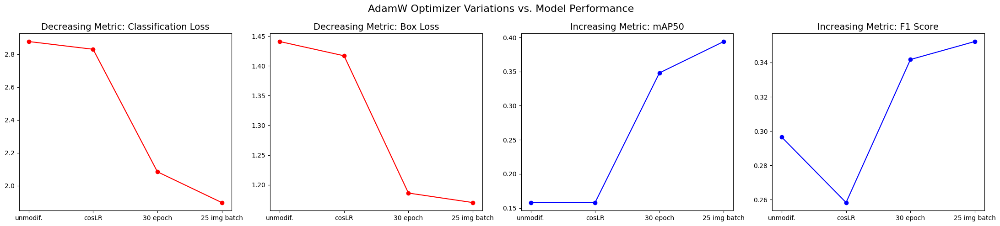

In [ ]:
graphTitle = "AdamW Optimizer Variations vs. Model Performance"
cls_loss = [2.877, 2.83, 2.085, 1.898]  # Data for subplot 1
box_loss = [1.441, 1.417, 1.186, 1.17] # Data for subplot 2
mAP50 = [0.158, 0.158, 0.348, 0.394]  # Data for subplot 2
precision = [0.504, 0.528, 0.294, 0.285]  # for calculating f1 score
recall = [0.21, 0.171, 0.408, 0.461]  # for calculating f1 score
categories = ['unmodif.', 'cosLR', '30 epoch', '25 img batch']

f1 = makeGraph(graphTitle, categories, cls_loss, box_loss, mAP50, precision, recall)

## <font color='purple'> Section 2: Adam Optimizer Variations vs. Model Performance

I plotted the same graphs for the Adam Optimizer. Respective trends for the Adam variations seem to be almost identical to the AdamW Optimizer.

<font color='purple'> *1) Decreasing Metric: Classification Loss*

<font color='purple'> *2) Decreasing Metric: Box Loss*

<font color='purple'> *3) Increasing Metric: mAP50*

<font color='purple'> *4) Increasing Metric: F1 Score*





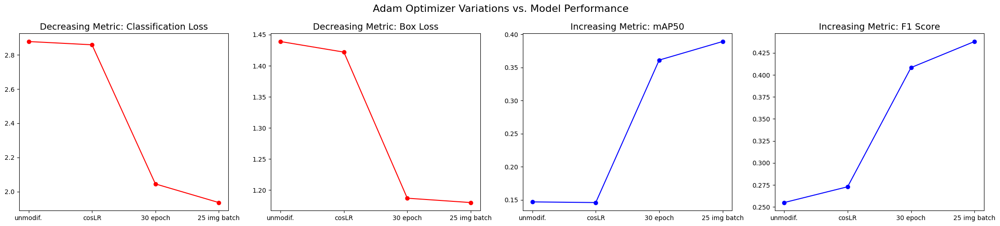

In [ ]:
graphTitleDUP = "Adam Optimizer Variations vs. Model Performance"
cls_lossDUP = [2.878, 2.859, 2.045, 1.936]  # Data for subplot 1
box_lossDUP = [1.439, 1.422, 1.187, 1.18] # Data for subplot 2
mAP50DUP = [0.147, 0.146, 0.361, 0.389]  # Data for subplot 2
precisionDUP = [0.501, 0.46, 0.361, 0.389]  # for calculating f1 score
recallDUP = [0.171, 0.194, 0.47, 0.501]  # for calculating f1 score
categoriesDUP = ['unmodif.', 'cosLR', '30 epoch', '25 img batch']

f1DUP = makeGraph(graphTitleDUP, categoriesDUP, cls_lossDUP, box_lossDUP, mAP50DUP, precisionDUP, recallDUP)

## <font color='purple'> Section 3: Comparison-- Optimizer Variations vs. Model Performance

I plotted graphs for each perfomance metric and used bar graphs to show the difference between AdamW and Adam models.

<font color='purple'> *1) Decreasing Metric: Classification Loss*

AdamW had the lowest loss in the final variation of the model with 25 images per batch.

<font color='purple'> *2) Decreasing Metric: Box Loss*

Box loss was essentially identical for both optimizers.

<font color='purple'> *3) Increasing Metric: mAP50*

The data suggests that AdamW has a slightly better mAP50 than Adam for each of the variations.

<font color='purple'> *4) Increasing Metric: F1 Score*

The f1 score for the Adam optimizer seems to be substantially better than AdamW, which is very interesting considering that the trends in most of the other metrics show very identical looking bar graphs.


In [ ]:
#COMPARING ADAMW AND ADAM OPTIMZERS WITH 2 COLUMN BAR GRAPHS FOR EACH METRIC

graphTitle = "Comparision: Optimizer Variations vs. Model Performance"
cls_lossDUP = [2.878, 2.859, 2.045, 1.936]
box_lossDUP = [1.439, 1.422, 1.187, 1.18]
mAP50DUP = [0.147, 0.146, 0.361, 0.389]
precisionDUP = [0.501, 0.46, 0.361, 0.389]
recallDUP = [0.171, 0.194, 0.47, 0.501]
categoriesDUP = ['unmodif.', 'cosLR', '30 epoch', '25 img batch']

f1 = [] # Data for subplot 3
for i in range(len(precision)):
  current = 2 * (precision[i]*recall[i])/(precision[i]+recall[i])
  f1.append(current)

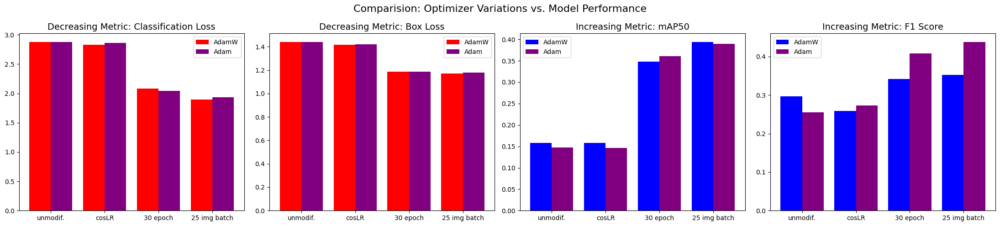

In [ ]:
# Create a figure and three subplots side by side
fig, axs = plt.subplots(1, 4, figsize=(22, 5))

# Create an array for bar positions
bar_positions = np.arange(len(categoriesDUP))

# Plotting bar graphs for each subplot
axs[0].bar(bar_positions - 0.2, cls_loss, color="red", width=0.4, label='AdamW')
axs[0].bar(bar_positions + 0.2, cls_lossDUP, color="purple", width=0.4, label='Adam')
axs[0].set_title('Decreasing Metric: Classification Loss', fontsize=14)
axs[0].set_xticks(bar_positions)
axs[0].set_xticklabels(categoriesDUP)
axs[0].legend()
axs[1].bar(bar_positions - 0.2, box_loss, color="red", width=0.4, label='AdamW')
axs[1].bar(bar_positions + 0.2, box_lossDUP, color="purple", width=0.4, label='Adam')
axs[1].set_title('Decreasing Metric: Box Loss', fontsize=14)
axs[1].set_xticks(bar_positions)
axs[1].set_xticklabels(categoriesDUP)
axs[1].legend()
axs[2].bar(bar_positions - 0.2, mAP50, color="blue", width=0.4, label='AdamW')
axs[2].bar(bar_positions + 0.2, mAP50DUP, color="purple", width=0.4, label='Adam')
axs[2].set_title('Increasing Metric: mAP50', fontsize=14)
axs[2].set_xticks(bar_positions)
axs[2].set_xticklabels(categoriesDUP)
axs[2].legend()
axs[3].bar(bar_positions - 0.2, f1, color="blue", width=0.4, label='AdamW')
axs[3].bar(bar_positions + 0.2, f1DUP, color="purple", width=0.4, label='Adam')
axs[3].set_title('Increasing Metric: F1 Score', fontsize=14)
axs[3].set_xticks(bar_positions)
axs[3].set_xticklabels(categoriesDUP)
axs[3].legend()

# Add an overall title for the subplots
fig.suptitle(graphTitle, fontsize=16)

# Adjust layout to prevent overlap
plt.tight_layout()

# Display the plot
plt.show()

# <font color='purple'> Sample Predictions

In general, a comparison of results suggest that the **model does not perform well in detection when there are multiple objects in one image.** For example, in the label for the image witht the tomato septoria leaf and leaf spots, the prediction image shows nothing. In the image with 8-11 tomato leaves labeled, the prediction image only shows 3-4 instances.

The sample image predictions are showed from the best model, from tuning experiment 5. The model had a AdamW optimizer, cos_lr scheduler, 30 epochs, and 25 images per batch.

It is also important to note that the classes were unbalanced in training and validation. When analyzing the classification data in the tuning experiments, all models perform better on classes with more instances, and worse on classes with fewer instances.


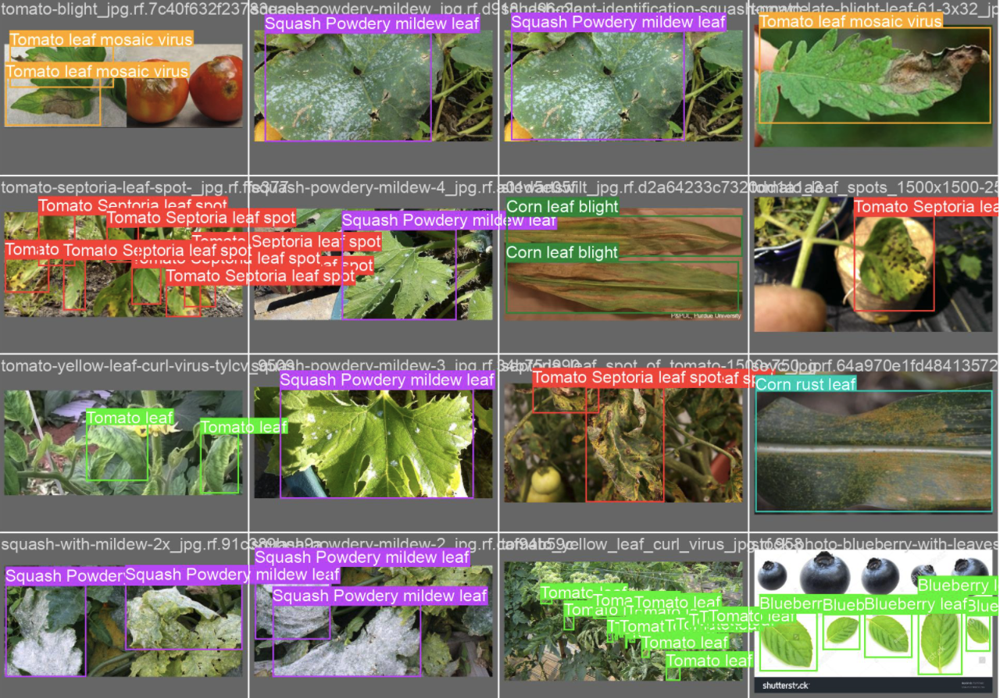
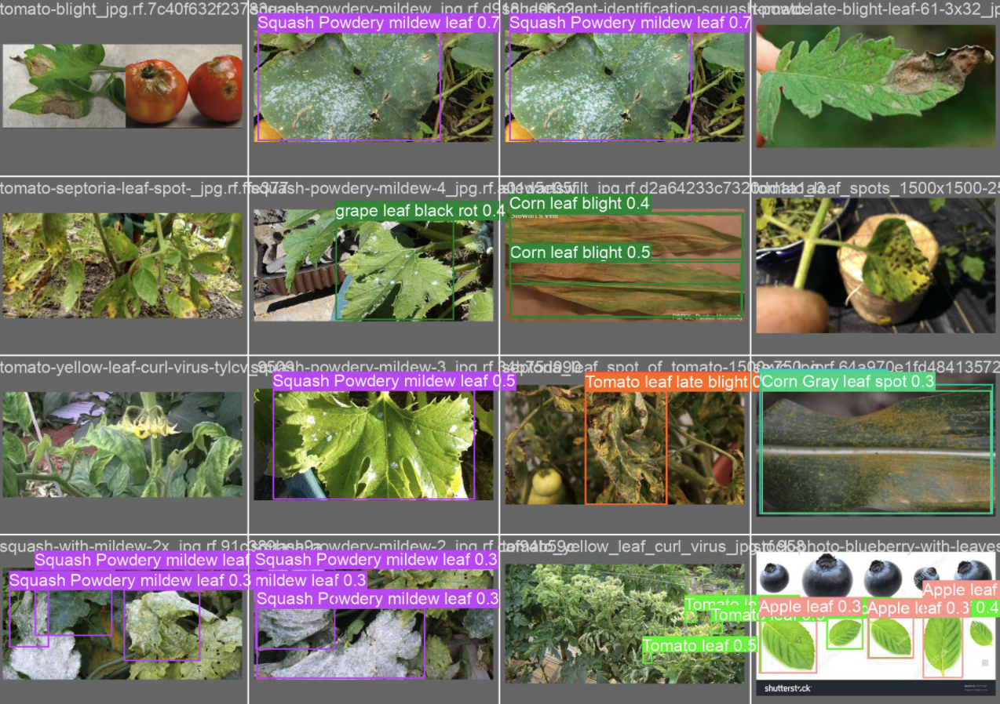


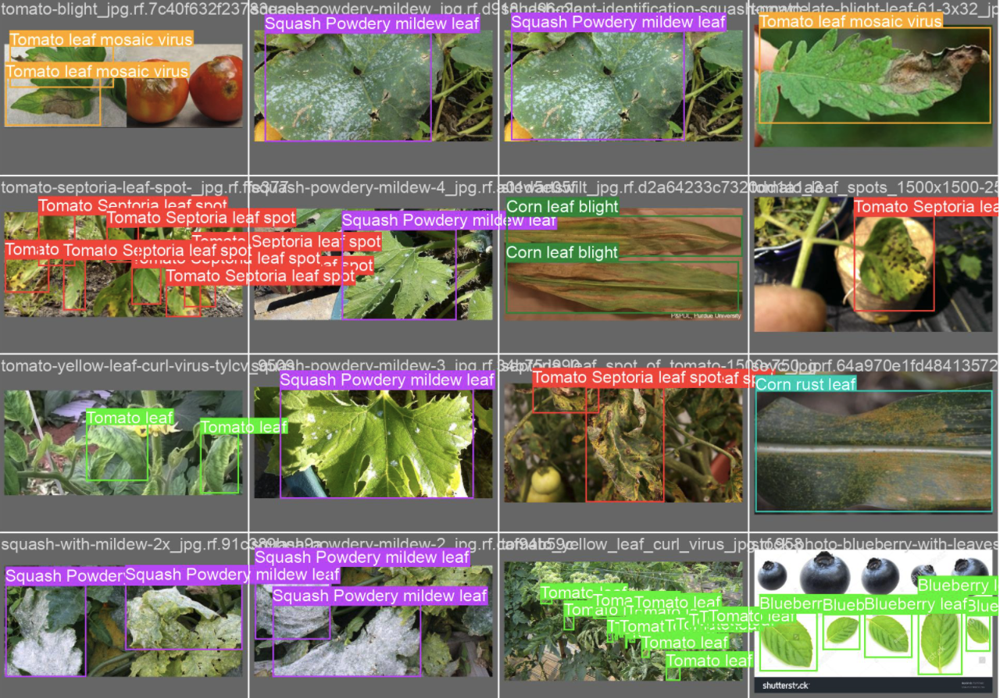
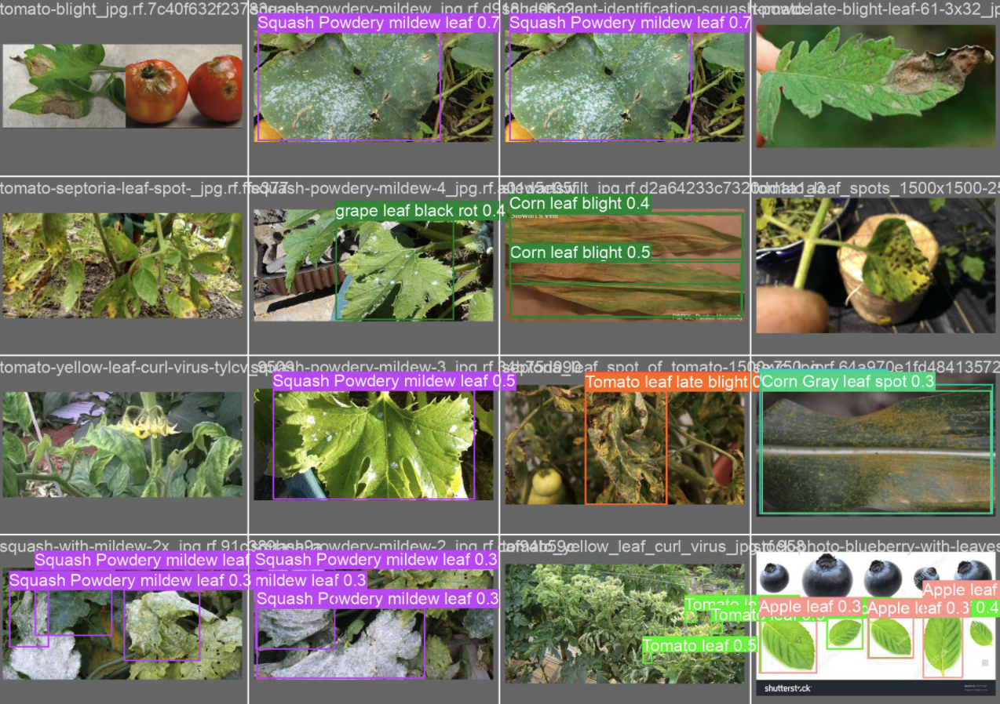

In [ ]:
# for side-by-side images:
!pip install ipyplot
import ipyplot
display.clear_output()

images_list = ["/content/label.png", "/content/pred.png"]
ipyplot.plot_images(images_list, max_images=20, img_width=850, force_b64=True)